# Modeling & Training - Treating Labels as Independent - 5 folds

## Author: Ian Scarff (iscarff123)

In [1]:
import pandas as pd
import numpy as np
import json
import os
import imageio
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.preprocessing import MultiLabelBinarizer
import time
import datetime

import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torchvision
from torchvision import transforms
from torchvision import models
from torch.utils.data import DataLoader, SubsetRandomSampler
from sklearn.model_selection import KFold
import skimage

from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

import warnings
warnings.filterwarnings('ignore')

## Data Preprocessing

### Load in reference data.

In [2]:
### Load in reference data

with open('training_data_task3.txt') as f: ### Training data
    training = json.load(f)
    
with open('testing_data_task3.txt') as f: ### Testing data
    testing = json.load(f)
    
classes = ['Smears', 'Loaded Language', 'Name calling/Labeling', 'Glittering generalities (Virtue)',
               'Appeal to (Strong) Emotions', 'Appeal to fear/prejudice', 'Transfer', 'Doubt',
               'Exaggeration/Minimisation', 'Whataboutism', 'Slogans', 'Flag-waving',
               "Misrepresentation of Someone's Position (Straw Man)", 'Causal Oversimplification',
               'Thought-terminating cliché', 'Black-and-white Fallacy/Dictatorship', 'Appeal to authority',
               'Reductio ad hitlerum', 'Repetition', 'Obfuscation, Intentional vagueness, Confusion',
               'Presenting Irrelevant Data (Red Herring)', 'Bandwagon']

### Create Class Binarizer
one_hot = MultiLabelBinarizer()
one_hot.fit([classes])

MultiLabelBinarizer()

In [3]:
one_hot.classes_

array(['Appeal to (Strong) Emotions', 'Appeal to authority',
       'Appeal to fear/prejudice', 'Bandwagon',
       'Black-and-white Fallacy/Dictatorship',
       'Causal Oversimplification', 'Doubt', 'Exaggeration/Minimisation',
       'Flag-waving', 'Glittering generalities (Virtue)',
       'Loaded Language',
       "Misrepresentation of Someone's Position (Straw Man)",
       'Name calling/Labeling',
       'Obfuscation, Intentional vagueness, Confusion',
       'Presenting Irrelevant Data (Red Herring)', 'Reductio ad hitlerum',
       'Repetition', 'Slogans', 'Smears', 'Thought-terminating cliché',
       'Transfer', 'Whataboutism'], dtype=object)

In [4]:
training[0:3]

[{'id': '182',
  'labels': ['Exaggeration/Minimisation',
   'Name calling/Labeling',
   'Smears',
   'Transfer'],
  'text': 'The most costly errors in all of history\n\nWorld Health Organization (WHO)\nPreliminary investigations conducted by the Chinese authorities have found no clear evidence of human-to-human transmission of the novel #coronavirus (2019-nCoV) identified in #Wuhan, #China\n14 Jan 2020\n\nWORLD NEWS FEBRUARY 3, 2020 / 10:33 PM / 2 MONTHS AGO\nWHO chief says widespread travel bans not needed to beat China virus\n',
  'image': '182_image.png'},
 {'id': '366_batch_2',
  'labels': ['Causal Oversimplification',
   'Loaded Language',
   'Name calling/Labeling'],
  'text': 'MY PARENTS WERE KILLED AS A RESULT OF A GUN FREE ZONE.\n\nI CARRIED A GUN AT ALL TIMES TILL IT WAS MADE A FELONY TO CARRY IN CERTAIN AREAS. \nA MAN WITH A GUN STARTED SHOOTING PEOPLE...\nI HAD THE PERFECT SHOT BUT WAS DISARMED BY LAWS.\n\n',
  'image': '366_image_batch_2.png'},
 {'id': '148',
  'labels': [

In [5]:
len(training)

727

In [6]:
testing[0:3]

[{'id': '566_batch_2',
  'labels': ['Appeal to (Strong) Emotions', 'Smears'],
  'text': "A FRIENDLY REMINDER...\n\nFERGUSON\n\nBALTIMORE\n\nMILWAUKEE\n\nCHARLOTTE\n\nIN CASE Y'ALL FORGOT !\n",
  'image': '566_image_batch_2.png'},
 {'id': '738_batch_2',
  'labels': ['Black-and-white Fallacy/Dictatorship',
   'Flag-waving',
   'Loaded Language',
   'Name calling/Labeling'],
  'text': "We're fed up.\nWe're not asking for our country back.\nWe're TAKING IT BACK\nWE THE PEOPLE ARE COMING\nAmerica was founded by pissed off people.\nAnd they're pissed again!",
  'image': '738_image_batch_2.png'},
 {'id': '885_batch_2',
  'labels': ['Smears'],
  'text': "PRESIDENTS' DAY SALE\n\nEVERYONE MUST GO",
  'image': '885_image_batch_2.png'}]

In [7]:
len(testing)

187

In [8]:
len(training) + len(testing)

914

### Extract Image Names & Labels

#### Training data

In [9]:
image_name = []
one_hot_labels = [] ### List to hold one hot labels

for obsv in training: ### Go through the training data

    ### Images ###
    image_name.append(obsv['image'])
    
    ### Labels
    one_hot_labels.append(one_hot.transform([obsv['labels']])[0])


#### Testing data

In [10]:
image_name2 = []
one_hot_labels2 = [] ### List to hold one hot labels

for obsv in testing: ### Go through the training data

    ### Images ###
    image_name2.append(obsv['image'])
    
    ### Labels
    one_hot_labels2.append(one_hot.transform([obsv['labels']])[0])

### Convert to json

#### Training

In [11]:
training_df = pd.DataFrame({
    'images' : image_name,
    'labels' : one_hot_labels
})

#### Testing

In [12]:
testing_df = pd.DataFrame({
    'images' : image_name2,
    'labels' : one_hot_labels2
})

In [13]:
training_df

,images,labels
0,182_image.png,"[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, ..."
1,366_image_batch_2.png,"[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, ..."
2,148_image.png,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, ..."
3,58_image_batch_2.png,"[0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ..."
4,816_image_batch_2.png,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, ..."
...,...,...
722,687_image_batch_2.png,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
723,516_image_batch_2.png,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
724,45_image_batch_2.png,"[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ..."
725,86_image_batch_2.png,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, ..."


In [14]:
testing_df

,images,labels
0,566_image_batch_2.png,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
1,738_image_batch_2.png,"[0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, ..."
2,885_image_batch_2.png,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,41_image_batch_2.png,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, ..."
4,169_image.png,"[0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, ..."
...,...,...
182,867_image_batch_2.png,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, ..."
183,901_image_batch_2.png,"[0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ..."
184,932_image_batch_2.png,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, ..."
185,967_image_batch_2.png,"[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, ..."


In [15]:
### Save to csv
training_df.to_json('training_data.json')
testing_df.to_json('testing_data.json')
### Saving as json retains list type in dataframe

# 
# 
# 

## Load Data with DataLoader

In [16]:
from CustomLoader import ImageLoader

In [17]:
training_data = ImageLoader(json_file = 'training_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

testing_data = ImageLoader(json_file = 'testing_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

In [18]:
train_loader = DataLoader(dataset = training_data, batch_size = 25, shuffle = True)
test_loader = DataLoader(dataset = testing_data, batch_size = 25, shuffle = True)

### Visualize Images

In [19]:
def imshow(img):
    img = img / 2 + 0.5
    plt.imshow(np.transpose(img, (1, 2, 0)))

#### Training Images

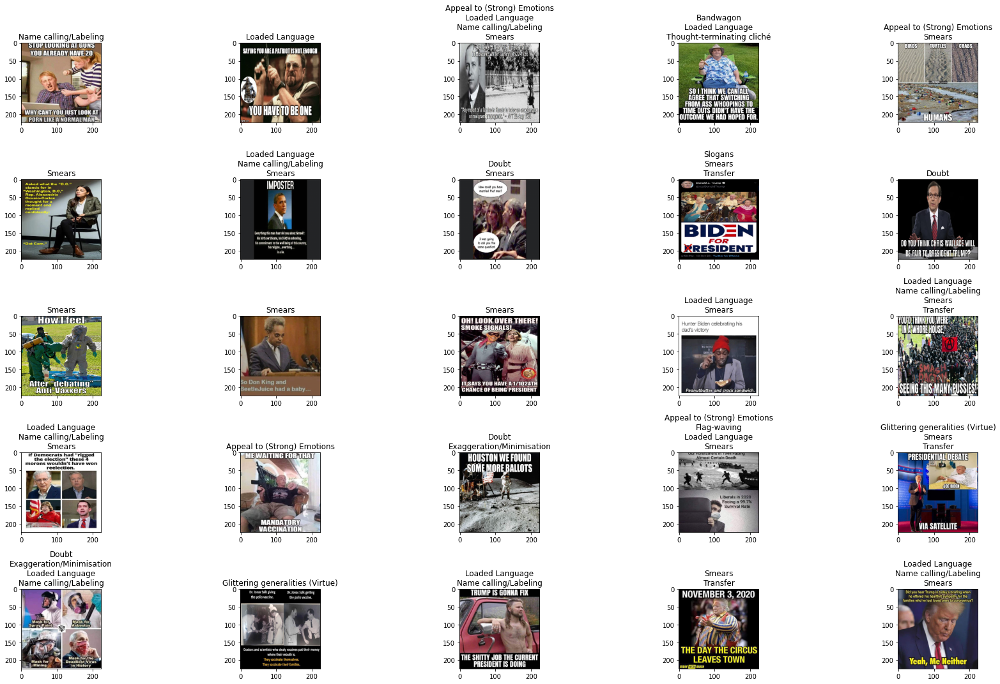

In [20]:
first_batch = iter(train_loader)
images_batch, labels_batch = first_batch.next()
images_batch = images_batch.numpy()
labels_batch = labels_batch.numpy()

fig = plt.figure(figsize = (25, 15))

for idx in np.arange(25):
    ax = fig.add_subplot(5, 5, idx + 1)
    imshow(images_batch[idx])
    
    title = ""
    k = 1
    for i in np.where(labels_batch[idx] == 1)[0]:
        if k == 1:
            title = title + one_hot.classes_[i]
            k+=1
        else:
            title = title + '\n' + one_hot.classes_[i]
            
    ax.set_title(title)
        
fig.tight_layout()

#### Testing Images

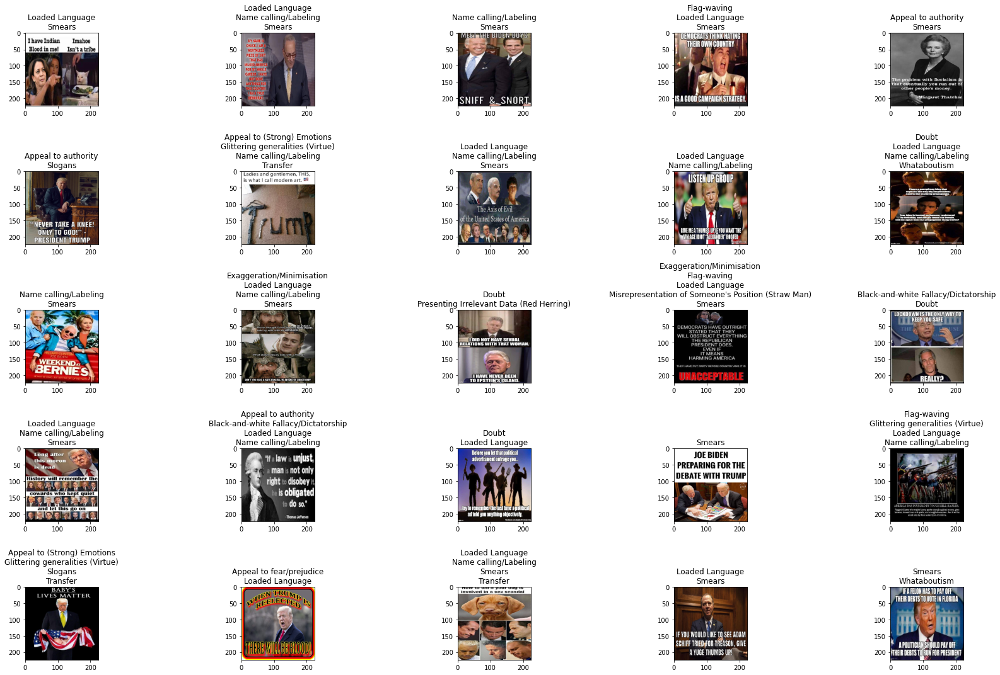

In [21]:
first_batch = iter(test_loader)
images_batch, labels_batch = first_batch.next()
images_batch = images_batch.numpy()
labels_batch = labels_batch.numpy()

fig = plt.figure(figsize = (25, 15))

for idx in np.arange(25):
    ax = fig.add_subplot(5, 5, idx + 1)
    imshow(images_batch[idx])
    
    title = ""
    k = 1
    for i in np.where(labels_batch[idx] == 1)[0]:
        if k == 1:
            title = title + one_hot.classes_[i]
            k+=1
        else:
            title = title + '\n' + one_hot.classes_[i]
            
    ax.set_title(title)
        
fig.tight_layout()

# 
# 
# 

## Define Training Methodology

In [22]:
def get_lr(optim):
    for param_group in optim.param_groups:
        return param_group['lr']

In [23]:
### This function is used to train a cnn model
def Kfold_train_CNN(model = None, training_data = None, learning_rate = None, k_folds = None, n_epochs = None, model_name = None):
    
    ### Check that all entries are valid
    if ((model == None) or (training_data == None) or (model_name == None) or 
        (learning_rate == None) or (k_folds == None) or (n_epochs == None)):
        print ('Enter all info.')
        
        
        
    ### Run K-Fold CV
    else:
        
        device = 'cpu'

        ### Set Loss Function and Optimizer
        criterion = nn.BCELoss()
        
        
        #### Define the K-fold Cross Validator
        kfold = KFold(n_splits=k_folds, shuffle=True)
        
        
        
        ### Create values to hold the best model metrics across folds
        val_f1_mic_max = 0 ### This determines best model
        
        best_train_loss = 0
        best_train_acc = 0
        best_train_f1_mic = 0
        best_train_f1_mac = 0
        best_train_prec_mic = 0
        best_train_prec_mac = 0
        best_train_rec_mic = 0
        best_train_rec_mac = 0

        best_val_acc = 0
        best_val_loss = 0
#         best_val_f1_mic = 0
        best_val_f1_mac = 0
        best_val_prec_mic = 0
        best_val_prec_mac = 0
        best_val_rec_mic = 0
        best_val_rec_mac = 0
        
        best_fold = 0
        best_epoch = 0
        

        
        ### Start print

        start = time.time()
        
        ### K-fold Cross Validation model evaluation
        for fold, (train_ids, val_ids) in enumerate(kfold.split(training_data)):
            
            print('-------------------------------------------')
            print('FOLD {}'.format(fold))
            print('-------------------------------------------')
            
            ### Sample elements randomly from a given list of ids, no replacement
            train_subsampler = SubsetRandomSampler(train_ids)
            val_subsampler = SubsetRandomSampler(val_ids)
            
            ### Define data loaders for training and validation in current fold
            train_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = train_subsampler)
            val_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = val_subsampler)
            
            ### Initialize network
            network = model
            if torch.cuda.is_available():
                network.cuda()
                network = nn.DataParallel(network, list(range(2)))
                device = 'cuda'
            
            ### Initialize optimizer
            optimizer = optim.Adam(model.parameters(), lr=learning_rate)
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.1, patience = 5)
            
            
            ### Create lists of values at the end of each epoch for each fold
            train_loss = []
            train_acc = []
            train_f1_mic = []
            train_f1_mac = []
            train_prec_mic = []
            train_prec_mac = []
            train_rec_mic = []
            train_rec_mac = []
            
            val_loss = []
            val_acc = []
            val_f1_mic = []
            val_f1_mac = []
            val_prec_mic = []
            val_prec_mac = []
            val_rec_mic = []
            val_rec_mac = []
            
            
            ### Train network
            for epoch in range(n_epochs):
                
                ### Hold training predictions and targets
                train_output = np.empty((0,22), int)
                train_all_targets = np.empty((0,22), int)
                
                val_output = np.empty((0,22), int)
                val_all_targets = np.empty((0,22), int)
                
                
                ### Train ###
                network.train()
                
                train_running_loss = 0.0
                
                batch_number = 0
                for i, data in enumerate(train_loader):
                    
                    images, targets = data[0].to(device), data[1].float().to(device)
                    optimizer.zero_grad()
                    
                    output = network(images)
                    
                    loss = criterion(output, targets) 
                    train_running_loss += loss.item()
                                        
                    ### Append output
                    train_output = np.vstack((train_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    train_all_targets = np.vstack((train_all_targets, targets.cpu().numpy().astype('int')))

                    loss.backward()
                    optimizer.step()
                                        
                    
                ### Calculate metrics and append
                train_loss.append(train_running_loss/len(train_loader.dataset))
                train_acc.append(accuracy_score(train_all_targets, train_output))
                train_f1_mic.append(f1_score(train_all_targets, train_output, average = 'micro'))
                train_f1_mac.append(f1_score(train_all_targets, train_output, average = 'macro'))
                train_prec_mic.append(precision_score(train_all_targets, train_output, average = 'micro'))
                train_prec_mac.append(precision_score(train_all_targets, train_output, average = 'macro'))
                train_rec_mic.append(recall_score(train_all_targets, train_output, average = 'micro'))
                train_rec_mac.append(recall_score(train_all_targets, train_output, average = 'macro'))
                
                
                ### Validate###
                network.eval()
                val_running_loss = 0.0

                                
                for i, data in enumerate(val_loader):
                    images, targets = data[0].to(device), data[1].float().to(device)
                    output = network(images)
                    loss = criterion(output, targets)
                    val_running_loss += loss.item()
                    
                    ### Append output
                    val_output = np.vstack((val_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    val_all_targets = np.vstack((val_all_targets, targets.cpu().numpy().astype('int')))

                
                ### Calculate metrics and append
                val_loss.append(val_running_loss/len(val_loader.dataset))
                val_acc.append(accuracy_score(val_all_targets, val_output))
                val_f1_mic.append(f1_score(val_all_targets, val_output, average = 'micro'))
                val_f1_mac.append(f1_score(val_all_targets, val_output, average = 'macro'))
                val_prec_mic.append(precision_score(val_all_targets, val_output, average = 'micro'))
                val_prec_mac.append(precision_score(val_all_targets, val_output, average = 'macro'))
                val_rec_mic.append(recall_score(val_all_targets, val_output, average = 'micro'))
                val_rec_mac.append(recall_score(val_all_targets, val_output, average = 'macro'))
                
                
                ### Save model with the lowest validation loss
                if val_f1_mic[epoch] >= val_f1_mic_max:
                    print('Validation F1 Micro Score Increased ({:.6f} --> {:.6f}).  Saving model ...\n'.format(
                    val_f1_mic_max,
                    val_f1_mic[epoch]))
                    torch.save(network.state_dict(), 'BestCnnModels_Ind_Labels_5folds/' + model_name +'.pt')
                    val_f1_mic_max = val_f1_mic[epoch]
                    
                    ### Set current best metrics
                    best_train_loss = train_loss[epoch]
                    best_train_acc = train_acc[epoch]
                    best_train_f1_mic = train_f1_mic[epoch]
                    best_train_f1_mac = train_f1_mac[epoch]
                    best_train_prec_mic = train_prec_mic[epoch]
                    best_train_prec_mac = train_prec_mac[epoch]
                    best_train_rec_mic = train_rec_mic[epoch]
                    best_train_rec_mac = train_rec_mac[epoch]

                    best_val_acc = val_acc[epoch]
                    best_val_loss = val_loss[epoch]
#                     best_val_f1_mic = val_f1_mic[epoch]
                    best_val_f1_mac = val_f1_mac[epoch]
                    best_val_prec_mic = val_prec_mic[epoch]
                    best_val_prec_mac = val_prec_mac[epoch]
                    best_val_rec_mic = val_rec_mic[epoch]
                    best_val_rec_mac = val_rec_mac[epoch]

                    best_fold = fold
                    best_epoch = epoch + 1
                    
                    
                    
                ### Display summary for epoch
                print('Epoch {} \tLearning Rate: {} \tTime (min): {}'.format(epoch+1, get_lr(optimizer), round((time.time()-start)/60, 2)))
                print('Train Loss: {} \tValidation Loss: {}'. format(round(train_loss[epoch], 4),
                                                                     round(val_loss[epoch], 4)))
                print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(train_acc[epoch], 4),
                                                                            round(val_acc[epoch], 4)))
                print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(train_f1_mic[epoch], 4),
                                                                            round(val_f1_mic[epoch], 4)))
                print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(train_f1_mac[epoch], 4),
                                                                            round(val_f1_mac[epoch], 4)))
                print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(train_prec_mic[epoch], 4),
                                                                                          round(val_prec_mic[epoch], 4)))
                print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(train_prec_mac[epoch], 4),
                                                                                          round(val_prec_mac[epoch], 4)))
                print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(train_rec_mic[epoch], 4),
                                                                                    round(val_rec_mic[epoch], 4)))
                print('Train Recall Marco: {} \tValidation Recall Macro: {}\n'.format(round(train_rec_mac[epoch], 4),
                                                                                    round(val_rec_mac[epoch], 4)))
                
                
                ### Update learning rate if needed
                scheduler.step(val_loss[epoch])
                
                
                
            ### Display summary graph of fold
            fig, (ax1, ax3) = plt.subplots(1,2, figsize = (20,6))
            ax1.set_xlabel('Epoch')
            ax1.set_ylabel('Loss')
            ln1 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), train_loss, label = 'Train Loss')
            ln2 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), val_loss, label = 'Val Loss')
            
            ax2 = ax1.twinx()
            ax2.set_ylabel('Accuracy')
            ln3 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), train_acc, marker = 'o', label = 'Train Acc')
            ln4 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), val_acc, marker = 'o', label = 'Val Acc')
            
            lns1 = ln1 + ln2 + ln3 + ln4
            labs1 = [l.get_label() for l in lns1]
            
            ax3.set_xlabel('Epoch')
            ax3.set_ylabel('Score')
            ln5 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mic, marker = 'v', label = 'Train F1 Micro')
            ln6 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mic, marker = 'v', label = 'Val F1 Micro')
            ln7 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mac, marker = '^', label = 'Train F1 Macro')
            ln8 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mac, marker = '^', label = 'Val F1 Micro')
            ln9 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mic, marker = 'd', label = 'Train Prec. Micro')
            ln10 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mic, marker = 'd', label = 'Val Prec. Micro')
            ln11 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mac, marker = 'X', label = 'Train Prec. Macro')
            ln12 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mac, marker = 'X', label = 'Val Prec. Macro')
            ln13 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mic, marker = 'P', label = 'Train Rec. Micro')
            ln14 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mic, marker = 'P', label = 'Val Rec. Micro')
            ln15 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mac, marker = 's', label = 'Train Rec. Macro')
            ln16 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mac, marker = 's', label = 'Val Rec. Macro')
            
            lns2 = ln5 + ln6 + ln7 + ln8 +  ln9 + ln10 + ln11 + ln12 + ln13 + ln14 + ln15 + ln16
            labs2 = [l.get_label() for l in lns2]
            
            
            ax1.legend(lns1, labs1, loc = 'upper left', bbox_to_anchor = (1.1,1))
            ax3.legend(lns2, labs2, loc = 'upper left', bbox_to_anchor = (1.05,1))
            fig.tight_layout()
            
            plt.show()
        
        
        
        ### Display metrics of the best model
                
        print('------------------------------------------------------------')
        print('------------------------------------------------------------')
        
        print('\nMetrics of Best Model:')
        print('Fold: {} \tEpoch: {}'.format(best_fold, best_epoch))
        print('Train Loss: {} \tValidation Loss: {}'. format(round(best_train_loss, 4),
                                                             round(best_val_loss, 4)))
        print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(best_train_acc, 4),
                                                                    round(best_val_acc, 4)))
        print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(best_train_f1_mic, 4),
                                                                    round(val_f1_mic_max, 4)))
        print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(best_train_f1_mac, 4),
                                                                    round(best_val_f1_mac, 4)))
        print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(best_train_prec_mic, 4),
                                                                                  round(best_val_prec_mic, 4)))
        print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(best_train_prec_mac, 4),
                                                                                  round(best_val_prec_mac, 4)))
        print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(best_train_rec_mic, 4),
                                                                            round(best_val_rec_mic, 4)))
        print('Train Recall Marco: {} \tValidation Recall Macro: {}'.format(round(best_train_rec_mac, 4),
                                                                            round(best_val_rec_mac, 4)))
  

# 
# 

## Define Models

### ResNet-18

In [24]:
### Import model
resnet18 = models.resnet18(pretrained = True)

In [25]:
print(resnet18)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [26]:
### Freeze parameters
for param in resnet18.parameters():
    param.requires_grad = False

In [27]:
### Change last layer to match output
resnet18.fc = nn.Sequential(
    nn.Linear(512, 22),
    nn.Sigmoid()
)

In [28]:
print(resnet18)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

### ResNet-50

In [29]:
### Import model
resnet50 = models.resnet50(pretrained = True)

In [30]:
print(resnet50)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [31]:
### Freeze parameters
for param in resnet50.parameters():
    param.requires_grad = False

In [32]:
### Change last layer to match output
resnet50.fc = nn.Sequential(
    nn.Linear(2048, 22),
    nn.Sigmoid()
)

In [33]:
print(resnet50)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

### ResNet-101

In [34]:
### Import model
resnet101 = models.resnet101(pretrained = True)

In [35]:
print(resnet101)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [36]:
### Freeze parameters
for param in resnet101.parameters():
    param.requires_grad = False

In [37]:
### Change last layer to match output
resnet101.fc = nn.Sequential(
    nn.Linear(2048, 22),
    nn.Sigmoid()
)

In [38]:
print(resnet101)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

### DenseNet-121

In [39]:
### Import model
densenet121 = models.densenet121(pretrained = True)

In [40]:
print(densenet121)

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [41]:
### Freeze parameters
for param in densenet121.parameters():
    param.requires_grad = False

In [42]:
### Change last layer to match output
densenet121.classifier = nn.Sequential(
    nn.Linear(1024, 22),
    nn.Sigmoid()
)

In [43]:
print(densenet121)

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

### DenseNet-169

In [44]:
### Import model
densenet169 = models.densenet169(pretrained = True)

In [45]:
print(densenet169)

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [46]:
### Freeze parameters
for param in densenet169.parameters():
    param.requires_grad = False

In [47]:
### Change last layer to match output
densenet169.classifier = nn.Sequential(
    nn.Linear(1664, 22),
    nn.Sigmoid()
)

In [48]:
print(densenet169)

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

### DenseNet-201

In [49]:
### Import model
densenet201 = models.densenet201(pretrained = True)

In [50]:
print(densenet201)

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [51]:
### Freeze parameters
for param in densenet201.parameters():
    param.requires_grad = False

In [52]:
### Change last layer to match output
densenet201.classifier = nn.Sequential(
    nn.Linear(1920, 22),
    nn.Sigmoid()
)

In [53]:
print(densenet201)

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

### VGG11_BN

In [54]:
### Import model
vgg11bn = models.vgg11_bn(pretrained = True)

In [55]:
print(vgg11bn)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): ReLU(inplace=True)
    (14): MaxPool2d(ke

In [56]:
### Freeze parameters
for param in vgg11bn.parameters():
    param.requires_grad = False

In [57]:
### Change last layer to match output
vgg11bn.classifier[6] = nn.Sequential(
    nn.Linear(4096, 22),
    nn.Sigmoid()
)

In [58]:
print(vgg11bn)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): ReLU(inplace=True)
    (14): MaxPool2d(ke

### VGG16_BN

In [59]:
### Import model
vgg16bn = models.vgg16_bn(pretrained = True)

In [60]:
print(vgg16bn)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256

In [61]:
### Freeze parameters
for param in vgg16bn.parameters():
    param.requires_grad = False

In [62]:
### Change last layer to match output
vgg16bn.classifier[6] = nn.Sequential(
    nn.Linear(4096, 22),
    nn.Sigmoid()
)

In [63]:
print(vgg16bn)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256

### VGG19_BN

In [64]:
### Import model
vgg19bn = models.vgg19_bn(pretrained = True)

In [65]:
print(vgg19bn)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256

In [66]:
### Freeze parameters
for param in vgg19bn.parameters():
    param.requires_grad = False

In [67]:
### Change last layer to match output
vgg19bn.classifier[6] = nn.Sequential(
    nn.Linear(4096, 22),
    nn.Sigmoid()
)

In [68]:
print(vgg19bn)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256

# 
# 
# 

## Train Models

In [69]:
START = time.time()

-------------------------------------------
FOLD 0
-------------------------------------------
Validation F1 Micro Score Increased (0.000000 --> 0.454023).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.0142 	Validation Loss: 0.003
Train Accuracy: 0.0551 	Validation Accuracy: 0.0479
Train F1 Mirco: 0.4101 	Validation F1 Micro: 0.454
Train F1 Marco: 0.1138 	Validation F1 Macro: 0.0896
Train Precision Mirco: 0.4431 	Validation Precision Micro: 0.5663
Train Precision Marco: 0.1415 	Validation Precision Macro: 0.1382
Train Recall Mirco: 0.3817 	Validation Recall Micro: 0.3789
Train Recall Marco: 0.108 	Validation Recall Macro: 0.0933

Validation F1 Micro Score Increased (0.454023 --> 0.515670).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.3
Train Loss: 0.0092 	Validation Loss: 0.0028
Train Accuracy: 0.1015 	Validation Accuracy: 0.0479
Train F1 Mirco: 0.5065 	Validation F1 Micro: 0.5157
Train F1 Marco: 0.1276 	Validation F1 Macro: 0.0993
Tr

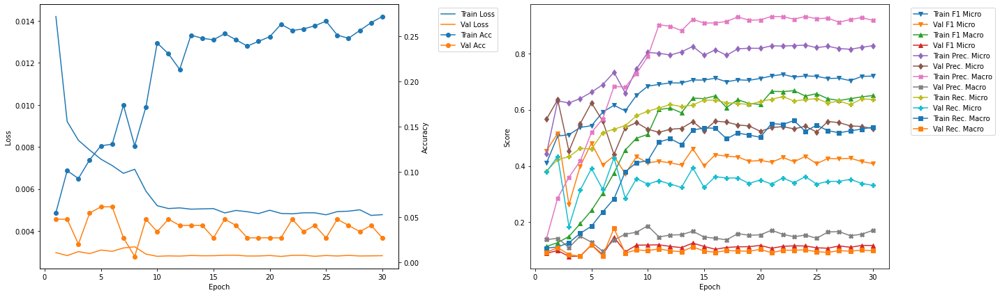

-------------------------------------------
FOLD 1
-------------------------------------------
Validation F1 Micro Score Increased (0.515670 --> 0.674510).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 3.95
Train Loss: 0.0095 	Validation Loss: 0.0015
Train Accuracy: 0.1205 	Validation Accuracy: 0.1712
Train F1 Mirco: 0.5596 	Validation F1 Micro: 0.6745
Train F1 Marco: 0.3336 	Validation F1 Macro: 0.4073
Train Precision Mirco: 0.6196 	Validation Precision Micro: 0.6582
Train Precision Marco: 0.4623 	Validation Precision Macro: 0.5073
Train Recall Mirco: 0.5102 	Validation Recall Micro: 0.6917
Train Recall Marco: 0.2749 	Validation Recall Macro: 0.413

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.07
Train Loss: 0.0069 	Validation Loss: 0.0016
Train Accuracy: 0.1687 	Validation Accuracy: 0.1301
Train F1 Mirco: 0.6267 	Validation F1 Micro: 0.5845
Train F1 Marco: 0.4844 	Validation F1 Macro: 0.3774
Train Precision Mirco: 0.6942 	Validation Precision Micro: 0.6761
Train Precisi

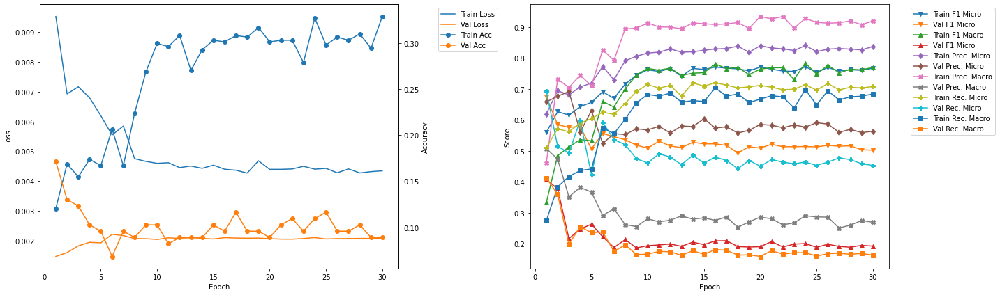

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.674510 --> 0.771588).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 7.66
Train Loss: 0.009 	Validation Loss: 0.0011
Train Accuracy: 0.11 	Validation Accuracy: 0.3379
Train F1 Mirco: 0.5729 	Validation F1 Micro: 0.7716
Train F1 Marco: 0.4155 	Validation F1 Macro: 0.6329
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.8195
Train Precision Marco: 0.5367 	Validation Precision Macro: 0.7334
Train Recall Mirco: 0.5431 	Validation Recall Micro: 0.7289
Train Recall Marco: 0.3564 	Validation Recall Macro: 0.6113

Epoch 2 	Learning Rate: 0.01 	Time (min): 7.78
Train Loss: 0.0063 	Validation Loss: 0.0012
Train Accuracy: 0.1564 	Validation Accuracy: 0.2552
Train F1 Mirco: 0.6476 	Validation F1 Micro: 0.7035
Train F1 Marco: 0.5817 	Validation F1 Macro: 0.5985
Train Precision Mirco: 0.7162 	Validation Precision Micro: 0.7857
Train Precision

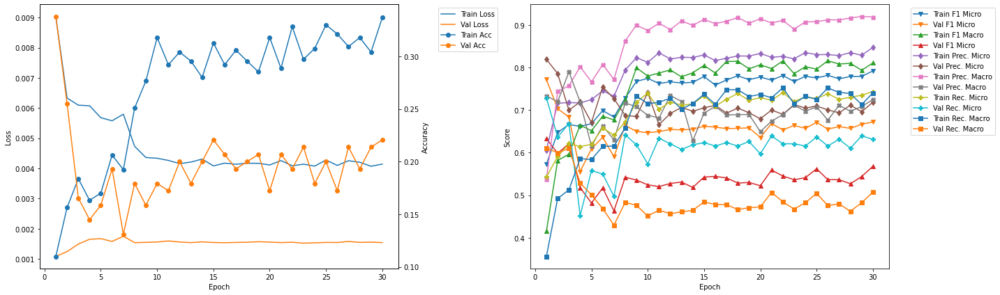

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.36
Train Loss: 0.0078 	Validation Loss: 0.0011
Train Accuracy: 0.1306 	Validation Accuracy: 0.2345
Train F1 Mirco: 0.6116 	Validation F1 Micro: 0.741
Train F1 Marco: 0.4951 	Validation F1 Macro: 0.5234
Train Precision Mirco: 0.6531 	Validation Precision Micro: 0.7391
Train Precision Marco: 0.6165 	Validation Precision Macro: 0.6837
Train Recall Mirco: 0.5751 	Validation Recall Micro: 0.7429
Train Recall Marco: 0.4295 	Validation Recall Macro: 0.5355

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.48
Train Loss: 0.006 	Validation Loss: 0.0011
Train Accuracy: 0.1942 	Validation Accuracy: 0.2276
Train F1 Mirco: 0.6832 	Validation F1 Micro: 0.7653
Train F1 Marco: 0.6527 	Validation F1 Macro: 0.6057
Train Precision Mirco: 0.7475 	Validation Precision Micro: 0.7195
Train Precision Marco: 0.7922 	Validation Precision Macro: 0.7078
Train Recall Mirco: 0.629 

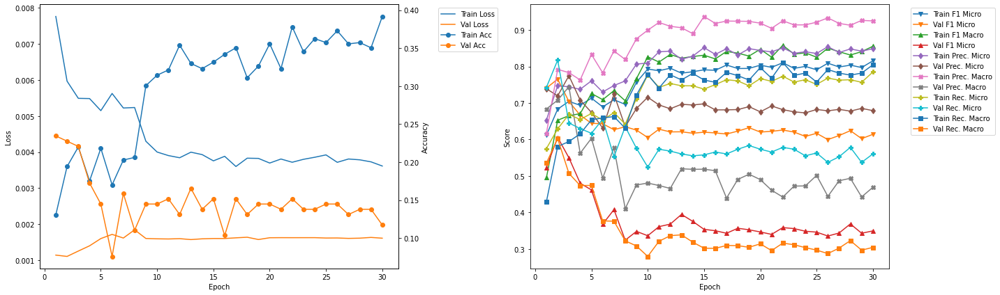

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 15.07
Train Loss: 0.0072 	Validation Loss: 0.0011
Train Accuracy: 0.1701 	Validation Accuracy: 0.1931
Train F1 Mirco: 0.6382 	Validation F1 Micro: 0.7677
Train F1 Marco: 0.6177 	Validation F1 Macro: 0.7481
Train Precision Mirco: 0.6714 	Validation Precision Micro: 0.7302
Train Precision Marco: 0.6954 	Validation Precision Macro: 0.8179
Train Recall Mirco: 0.6081 	Validation Recall Micro: 0.8093
Train Recall Marco: 0.5656 	Validation Recall Macro: 0.7565

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.19
Train Loss: 0.0058 	Validation Loss: 0.0011
Train Accuracy: 0.2148 	Validation Accuracy: 0.2414
Train F1 Mirco: 0.6897 	Validation F1 Micro: 0.7569
Train F1 Marco: 0.6649 	Validation F1 Macro: 0.752
Train Precision Mirco: 0.7229 	Validation Precision Micro: 0.7721
Train Precision Marco: 0.7779 	Validation Precision Macro: 0.795
Train Recall Mirco: 0.6594

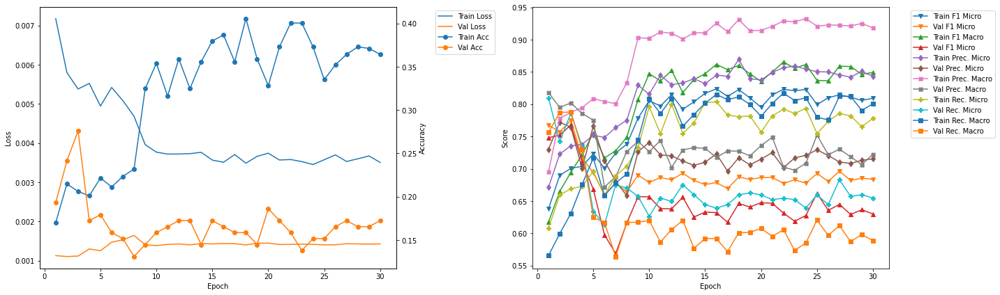

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 3
Train Loss: 0.0054 	Validation Loss: 0.0011
Train Accuracy: 0.2062 	Validation Accuracy: 0.2759
Train F1 Mirco: 0.7007 	Validation F1 Micro: 0.7751
Train F1 Marco: 0.6946 	Validation F1 Macro: 0.768
Train Precision Mirco: 0.7355 	Validation Precision Micro: 0.7644
Train Precision Marco: 0.7875 	Validation Precision Macro: 0.802
Train Recall Mirco: 0.669 	Validation Recall Micro: 0.7861
Train Recall Marco: 0.631 	Validation Recall Macro: 0.788


In [70]:
Kfold_train_CNN(model = resnet18, training_data = training_data, learning_rate = 0.01, k_folds = 5, n_epochs = 30, model_name = 'resnet18')

-------------------------------------------
FOLD 0
-------------------------------------------
Validation F1 Micro Score Increased (0.000000 --> 0.352052).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 0.14
Train Loss: 0.029 	Validation Loss: 0.0057
Train Accuracy: 0.0327 	Validation Accuracy: 0.0
Train F1 Mirco: 0.3903 	Validation F1 Micro: 0.3521
Train F1 Marco: 0.1213 	Validation F1 Macro: 0.0906
Train Precision Mirco: 0.4066 	Validation Precision Micro: 0.3123
Train Precision Marco: 0.1276 	Validation Precision Macro: 0.1137
Train Recall Mirco: 0.3752 	Validation Recall Micro: 0.4035
Train Recall Marco: 0.1209 	Validation Recall Macro: 0.1799

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.28
Train Loss: 0.0181 	Validation Loss: 0.005
Train Accuracy: 0.0654 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4894 	Validation F1 Micro: 0.3241
Train F1 Marco: 0.1613 	Validation F1 Macro: 0.1039
Train Precision Mirco: 0.5628 	Validation Precision Micro: 0.6331
Train Precision M

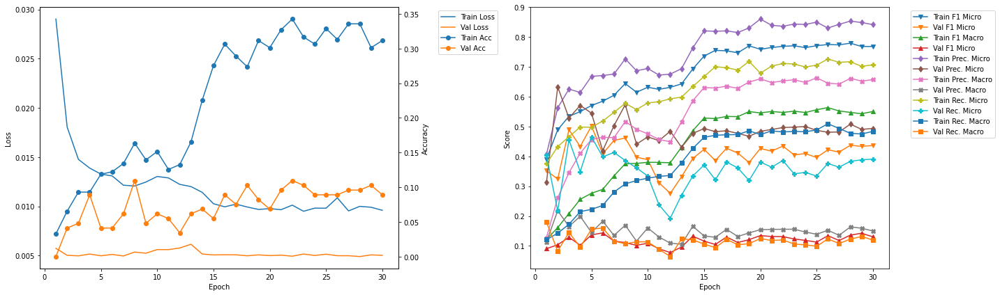

-------------------------------------------
FOLD 1
-------------------------------------------
Validation F1 Micro Score Increased (0.502003 --> 0.568421).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 4.29
Train Loss: 0.0197 	Validation Loss: 0.0022
Train Accuracy: 0.0723 	Validation Accuracy: 0.1301
Train F1 Mirco: 0.5184 	Validation F1 Micro: 0.5684
Train F1 Marco: 0.2662 	Validation F1 Macro: 0.2826
Train Precision Mirco: 0.5404 	Validation Precision Micro: 0.7397
Train Precision Marco: 0.2892 	Validation Precision Macro: 0.4115
Train Recall Mirco: 0.4981 	Validation Recall Micro: 0.4615
Train Recall Marco: 0.2513 	Validation Recall Macro: 0.2877

Validation F1 Micro Score Increased (0.568421 --> 0.723214).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.44
Train Loss: 0.0109 	Validation Loss: 0.0016
Train Accuracy: 0.1411 	Validation Accuracy: 0.2808
Train F1 Mirco: 0.627 	Validation F1 Micro: 0.7232
Train F1 Marco: 0.3904 	Validation F1 Macro: 0.4905

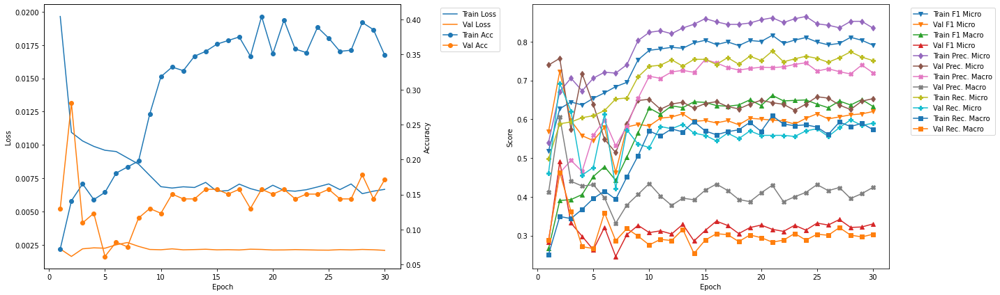

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.723214 --> 0.740467).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 8.44
Train Loss: 0.0154 	Validation Loss: 0.0018
Train Accuracy: 0.1031 	Validation Accuracy: 0.2138
Train F1 Mirco: 0.5687 	Validation F1 Micro: 0.7405
Train F1 Marco: 0.3456 	Validation F1 Macro: 0.5233
Train Precision Mirco: 0.6 	Validation Precision Micro: 0.7167
Train Precision Marco: 0.3819 	Validation Precision Macro: 0.6122
Train Recall Mirco: 0.5405 	Validation Recall Micro: 0.7659
Train Recall Marco: 0.319 	Validation Recall Macro: 0.5407

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.58
Train Loss: 0.0096 	Validation Loss: 0.0021
Train Accuracy: 0.177 	Validation Accuracy: 0.1103
Train F1 Mirco: 0.6722 	Validation F1 Micro: 0.6154
Train F1 Marco: 0.45 	Validation F1 Macro: 0.3992
Train Precision Mirco: 0.6983 	Validation Precision Micro: 0.6552
Train Precision Mar

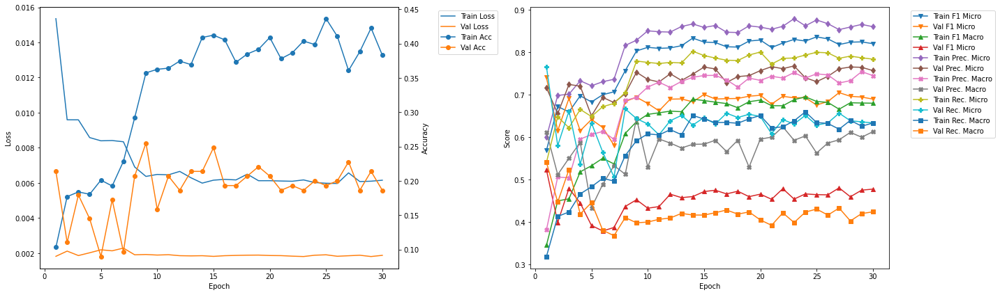

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.58
Train Loss: 0.0146 	Validation Loss: 0.0026
Train Accuracy: 0.1014 	Validation Accuracy: 0.1172
Train F1 Mirco: 0.5829 	Validation F1 Micro: 0.7134
Train F1 Marco: 0.3662 	Validation F1 Macro: 0.4876
Train Precision Mirco: 0.5964 	Validation Precision Micro: 0.7768
Train Precision Marco: 0.3971 	Validation Precision Macro: 0.6258
Train Recall Mirco: 0.5699 	Validation Recall Micro: 0.6595
Train Recall Marco: 0.3443 	Validation Recall Macro: 0.471

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.71
Train Loss: 0.0087 	Validation Loss: 0.0023
Train Accuracy: 0.2045 	Validation Accuracy: 0.2
Train F1 Mirco: 0.6784 	Validation F1 Micro: 0.704
Train F1 Marco: 0.4885 	Validation F1 Macro: 0.6279
Train Precision Mirco: 0.7029 	Validation Precision Micro: 0.7714
Train Precision Marco: 0.5559 	Validation Precision Macro: 0.6881
Train Recall Mirco: 0.6556 	V

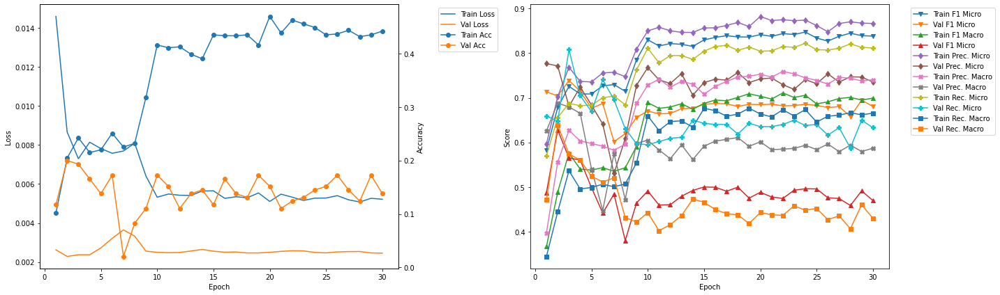

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.740467 --> 0.836461).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 16.71
Train Loss: 0.0154 	Validation Loss: 0.001
Train Accuracy: 0.1048 	Validation Accuracy: 0.4069
Train F1 Mirco: 0.5662 	Validation F1 Micro: 0.8365
Train F1 Marco: 0.3576 	Validation F1 Macro: 0.6409
Train Precision Mirco: 0.581 	Validation Precision Micro: 0.8571
Train Precision Marco: 0.3761 	Validation Precision Macro: 0.6858
Train Recall Mirco: 0.5521 	Validation Recall Micro: 0.8168
Train Recall Marco: 0.3435 	Validation Recall Macro: 0.6511

Validation F1 Micro Score Increased (0.836461 --> 0.842653).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 16.85
Train Loss: 0.0085 	Validation Loss: 0.0011
Train Accuracy: 0.232 	Validation Accuracy: 0.4207
Train F1 Mirco: 0.7087 	Validation F1 Micro: 0.8427
Train F1 Marco: 0.5108 	Validation F1 Macro: 0.6538

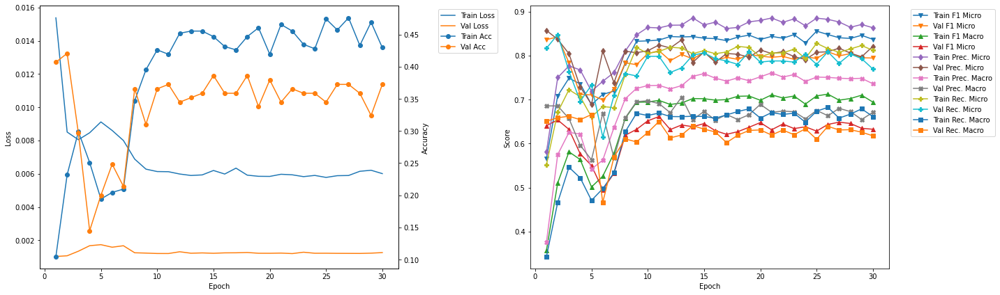

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 2
Train Loss: 0.0085 	Validation Loss: 0.0011
Train Accuracy: 0.232 	Validation Accuracy: 0.4207
Train F1 Mirco: 0.7087 	Validation F1 Micro: 0.8427
Train F1 Marco: 0.5108 	Validation F1 Macro: 0.6538
Train Precision Mirco: 0.7502 	Validation Precision Micro: 0.8372
Train Precision Marco: 0.5752 	Validation Precision Macro: 0.6858
Train Recall Mirco: 0.6716 	Validation Recall Micro: 0.8482
Train Recall Marco: 0.4666 	Validation Recall Macro: 0.6589


In [71]:
Kfold_train_CNN(model = resnet50, training_data = training_data, learning_rate = 0.01, k_folds = 5, n_epochs = 30, model_name = 'resnet50')

-------------------------------------------
FOLD 0
-------------------------------------------
Validation F1 Micro Score Increased (0.000000 --> 0.400000).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 0.16
Train Loss: 0.0258 	Validation Loss: 0.0044
Train Accuracy: 0.0275 	Validation Accuracy: 0.0205
Train F1 Mirco: 0.3857 	Validation F1 Micro: 0.4
Train F1 Marco: 0.1129 	Validation F1 Macro: 0.1102
Train Precision Mirco: 0.4011 	Validation Precision Micro: 0.3352
Train Precision Marco: 0.1167 	Validation Precision Macro: 0.0998
Train Recall Mirco: 0.3715 	Validation Recall Micro: 0.4958
Train Recall Marco: 0.1108 	Validation Recall Macro: 0.2093

Validation F1 Micro Score Increased (0.400000 --> 0.441041).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.32
Train Loss: 0.0181 	Validation Loss: 0.0039
Train Accuracy: 0.0861 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4876 	Validation F1 Micro: 0.441
Train F1 Marco: 0.1691 	Validation F1 Macro: 0.0812
Tr

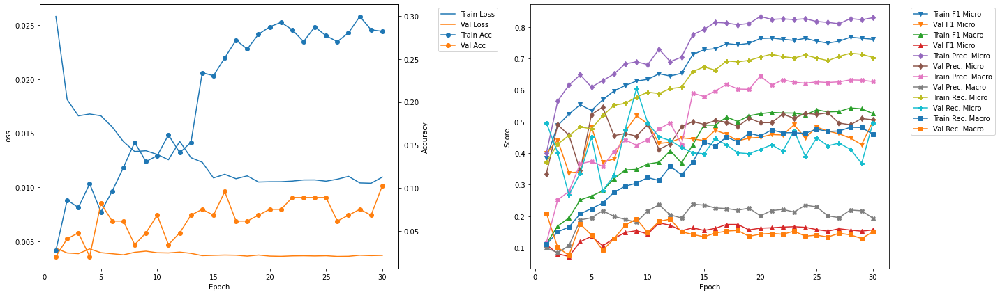

-------------------------------------------
FOLD 1
-------------------------------------------
Validation F1 Micro Score Increased (0.518519 --> 0.652893).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 4.88
Train Loss: 0.0215 	Validation Loss: 0.004
Train Accuracy: 0.0637 	Validation Accuracy: 0.1438
Train F1 Mirco: 0.4883 	Validation F1 Micro: 0.6529
Train F1 Marco: 0.2403 	Validation F1 Macro: 0.301
Train Precision Mirco: 0.4993 	Validation Precision Micro: 0.7096
Train Precision Marco: 0.2575 	Validation Precision Macro: 0.41
Train Recall Mirco: 0.4778 	Validation Recall Micro: 0.6046
Train Recall Marco: 0.2292 	Validation Recall Macro: 0.3168

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.03
Train Loss: 0.0125 	Validation Loss: 0.0038
Train Accuracy: 0.1153 	Validation Accuracy: 0.1644
Train F1 Mirco: 0.6017 	Validation F1 Micro: 0.6496
Train F1 Marco: 0.3259 	Validation F1 Macro: 0.4202
Train Precision Mirco: 0.6534 	Validation Precision Micro: 0.6513
Train Precision 

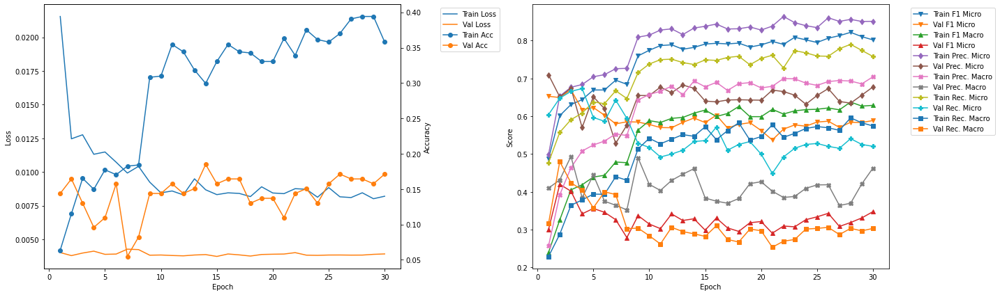

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.670090 --> 0.714104).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 9.68
Train Loss: 0.02 	Validation Loss: 0.0032
Train Accuracy: 0.0825 	Validation Accuracy: 0.2
Train F1 Mirco: 0.5249 	Validation F1 Micro: 0.7141
Train F1 Marco: 0.2818 	Validation F1 Macro: 0.4453
Train Precision Mirco: 0.5412 	Validation Precision Micro: 0.7784
Train Precision Marco: 0.3001 	Validation Precision Macro: 0.4804
Train Recall Mirco: 0.5095 	Validation Recall Micro: 0.6596
Train Recall Marco: 0.2705 	Validation Recall Macro: 0.4729

Validation F1 Micro Score Increased (0.714104 --> 0.776350).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.86
Train Loss: 0.0135 	Validation Loss: 0.0025
Train Accuracy: 0.1753 	Validation Accuracy: 0.2621
Train F1 Mirco: 0.6253 	Validation F1 Micro: 0.7763
Train F1 Marco: 0.3665 	Validation F1 Macro: 0.5459
Tra

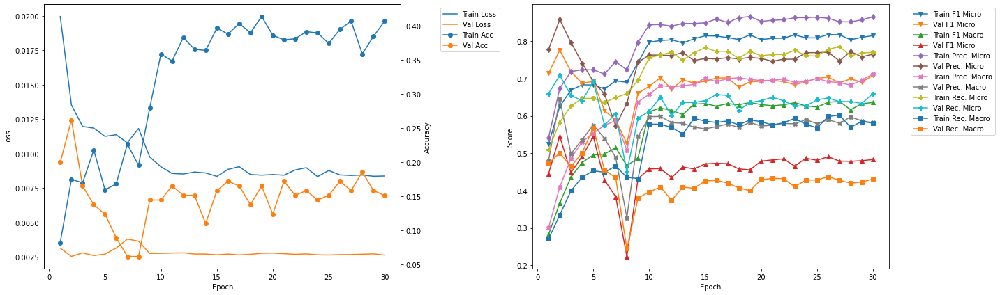

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 14.45
Train Loss: 0.0204 	Validation Loss: 0.0031
Train Accuracy: 0.0859 	Validation Accuracy: 0.1103
Train F1 Mirco: 0.5336 	Validation F1 Micro: 0.6356
Train F1 Marco: 0.2917 	Validation F1 Macro: 0.4344
Train Precision Mirco: 0.5536 	Validation Precision Micro: 0.6705
Train Precision Marco: 0.3117 	Validation Precision Macro: 0.5174
Train Recall Mirco: 0.515 	Validation Recall Micro: 0.6042
Train Recall Marco: 0.2778 	Validation Recall Macro: 0.5142

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.6
Train Loss: 0.0138 	Validation Loss: 0.0027
Train Accuracy: 0.1581 	Validation Accuracy: 0.2138
Train F1 Mirco: 0.6456 	Validation F1 Micro: 0.7633
Train F1 Marco: 0.4277 	Validation F1 Macro: 0.5007
Train Precision Mirco: 0.664 	Validation Precision Micro: 0.6883
Train Precision Marco: 0.4483 	Validation Precision Macro: 0.5407
Train Recall Mirco: 0.6283 

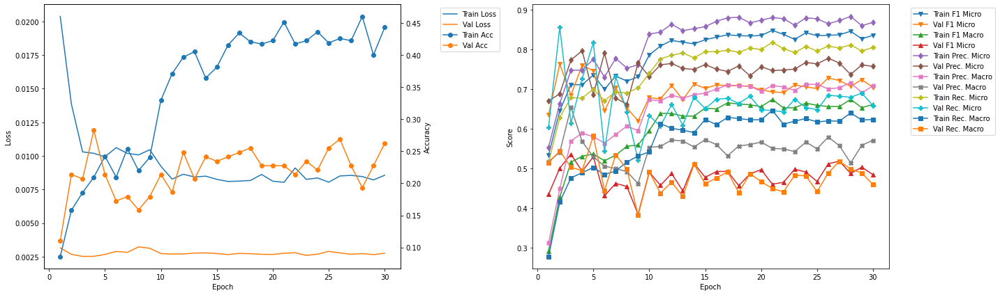

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.13
Train Loss: 0.0208 	Validation Loss: 0.0018
Train Accuracy: 0.1048 	Validation Accuracy: 0.2069
Train F1 Mirco: 0.5617 	Validation F1 Micro: 0.7096
Train F1 Marco: 0.3289 	Validation F1 Macro: 0.4787
Train Precision Mirco: 0.5682 	Validation Precision Micro: 0.8404
Train Precision Marco: 0.3528 	Validation Precision Macro: 0.6569
Train Recall Mirco: 0.5554 	Validation Recall Micro: 0.614
Train Recall Marco: 0.3158 	Validation Recall Macro: 0.4959

Validation F1 Micro Score Increased (0.776350 --> 0.780124).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.29
Train Loss: 0.0114 	Validation Loss: 0.0019
Train Accuracy: 0.1753 	Validation Accuracy: 0.2
Train F1 Mirco: 0.6907 	Validation F1 Micro: 0.7801
Train F1 Marco: 0.5172 	Validation F1 Macro: 0.5894
Train Precision Mirco: 0.7375 	Validation Precision Micro: 0.7494
Train Precisio

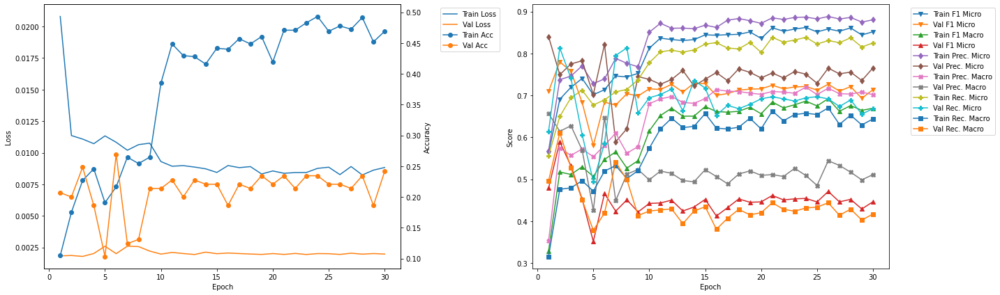

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 2
Train Loss: 0.0114 	Validation Loss: 0.0019
Train Accuracy: 0.1753 	Validation Accuracy: 0.2
Train F1 Mirco: 0.6907 	Validation F1 Micro: 0.7801
Train F1 Marco: 0.5172 	Validation F1 Macro: 0.5894
Train Precision Mirco: 0.7375 	Validation Precision Micro: 0.7494
Train Precision Marco: 0.5741 	Validation Precision Macro: 0.6142
Train Recall Mirco: 0.6496 	Validation Recall Micro: 0.8135
Train Recall Marco: 0.4759 	Validation Recall Macro: 0.6112


In [72]:
Kfold_train_CNN(model = resnet101, training_data = training_data, learning_rate = 0.01, k_folds = 5, n_epochs = 30, model_name = 'resnet101')

-------------------------------------------
FOLD 0
-------------------------------------------
Validation F1 Micro Score Increased (0.000000 --> 0.383602).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 0.14
Train Loss: 0.0161 	Validation Loss: 0.0028
Train Accuracy: 0.0671 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.3965 	Validation F1 Micro: 0.3836
Train F1 Marco: 0.1156 	Validation F1 Macro: 0.0756
Train Precision Mirco: 0.4271 	Validation Precision Micro: 0.4695
Train Precision Marco: 0.133 	Validation Precision Macro: 0.0855
Train Recall Mirco: 0.3701 	Validation Recall Micro: 0.3243
Train Recall Marco: 0.109 	Validation Recall Macro: 0.0965

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.29
Train Loss: 0.0096 	Validation Loss: 0.0024
Train Accuracy: 0.1033 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5134 	Validation F1 Micro: 0.3525
Train F1 Marco: 0.113 	Validation F1 Macro: 0.0874
Train Precision Mirco: 0.6265 	Validation Precision Micro: 0.5591
Train Precision

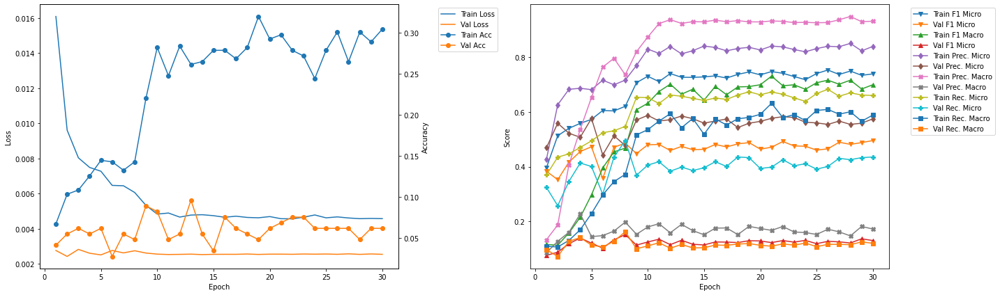

-------------------------------------------
FOLD 1
-------------------------------------------
Validation F1 Micro Score Increased (0.495775 --> 0.560122).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 4.42
Train Loss: 0.009 	Validation Loss: 0.0019
Train Accuracy: 0.1377 	Validation Accuracy: 0.0753
Train F1 Mirco: 0.5643 	Validation F1 Micro: 0.5601
Train F1 Marco: 0.3732 	Validation F1 Macro: 0.4104
Train Precision Mirco: 0.6248 	Validation Precision Micro: 0.716
Train Precision Marco: 0.5241 	Validation Precision Macro: 0.5839
Train Recall Mirco: 0.5145 	Validation Recall Micro: 0.46
Train Recall Marco: 0.305 	Validation Recall Macro: 0.4096

Validation F1 Micro Score Increased (0.560122 --> 0.663818).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.56
Train Loss: 0.0074 	Validation Loss: 0.0015
Train Accuracy: 0.1325 	Validation Accuracy: 0.1575
Train F1 Mirco: 0.6137 	Validation F1 Micro: 0.6638
Train F1 Marco: 0.4703 	Validation F1 Macro: 0.4943
Tra

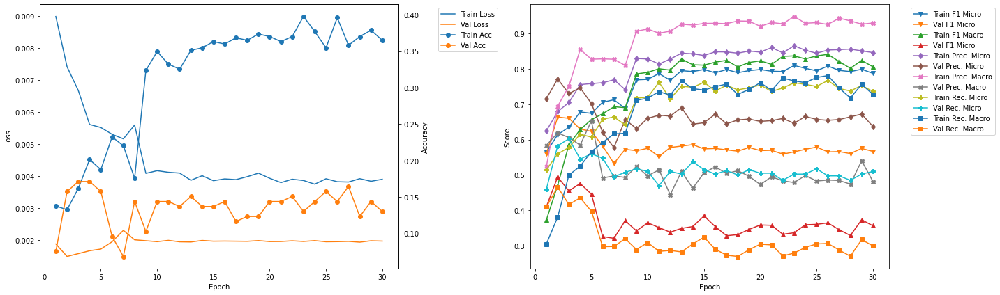

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.663818 --> 0.773196).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 8.67
Train Loss: 0.0075 	Validation Loss: 0.001
Train Accuracy: 0.1529 	Validation Accuracy: 0.2414
Train F1 Mirco: 0.6174 	Validation F1 Micro: 0.7732
Train F1 Marco: 0.4798 	Validation F1 Macro: 0.7408
Train Precision Mirco: 0.6712 	Validation Precision Micro: 0.7772
Train Precision Marco: 0.5799 	Validation Precision Macro: 0.8121
Train Recall Mirco: 0.5716 	Validation Recall Micro: 0.7692
Train Recall Marco: 0.4182 	Validation Recall Macro: 0.7233

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.81
Train Loss: 0.0059 	Validation Loss: 0.0011
Train Accuracy: 0.1924 	Validation Accuracy: 0.2552
Train F1 Mirco: 0.6825 	Validation F1 Micro: 0.7601
Train F1 Marco: 0.6353 	Validation F1 Macro: 0.6959
Train Precision Mirco: 0.7348 	Validation Precision Micro: 0.7305
Train Precisi

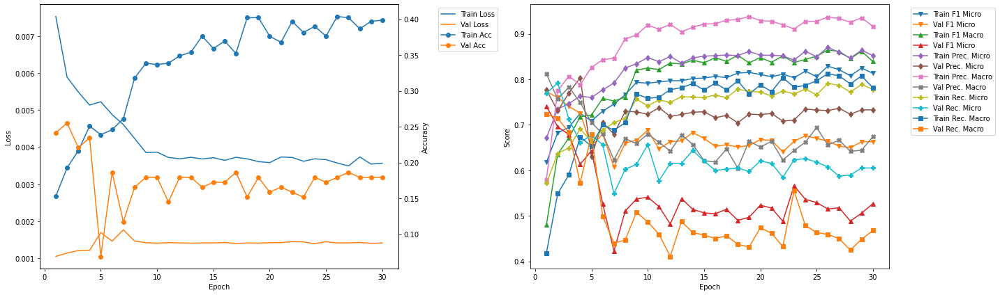

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.92
Train Loss: 0.0071 	Validation Loss: 0.001
Train Accuracy: 0.1684 	Validation Accuracy: 0.269
Train F1 Mirco: 0.6527 	Validation F1 Micro: 0.7704
Train F1 Marco: 0.607 	Validation F1 Macro: 0.6956
Train Precision Mirco: 0.697 	Validation Precision Micro: 0.7292
Train Precision Marco: 0.7219 	Validation Precision Macro: 0.7787
Train Recall Mirco: 0.6136 	Validation Recall Micro: 0.8165
Train Recall Marco: 0.5415 	Validation Recall Macro: 0.722

Validation F1 Micro Score Increased (0.773196 --> 0.801178).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.06
Train Loss: 0.006 	Validation Loss: 0.0009
Train Accuracy: 0.1821 	Validation Accuracy: 0.3448
Train F1 Mirco: 0.6729 	Validation F1 Micro: 0.8012
Train F1 Marco: 0.621 	Validation F1 Macro: 0.7212
Train Precision Mirco: 0.7097 	Validation Precision Micro: 0.8977
Train Precision M

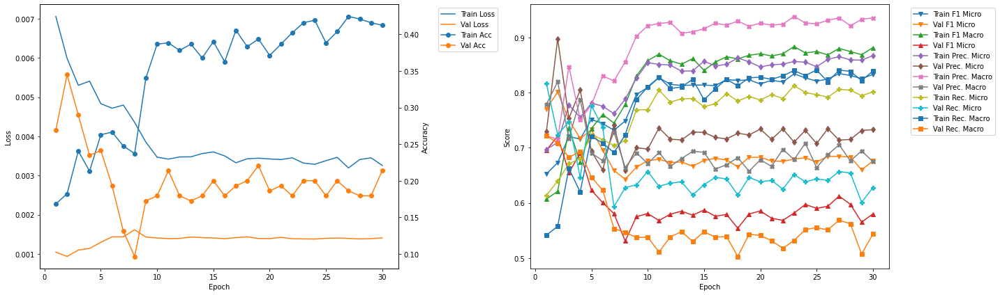

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.801178 --> 0.830243).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 17.17
Train Loss: 0.0065 	Validation Loss: 0.0008
Train Accuracy: 0.2062 	Validation Accuracy: 0.3931
Train F1 Mirco: 0.6799 	Validation F1 Micro: 0.8302
Train F1 Marco: 0.626 	Validation F1 Macro: 0.794
Train Precision Mirco: 0.7078 	Validation Precision Micro: 0.8981
Train Precision Marco: 0.739 	Validation Precision Macro: 0.8321
Train Recall Mirco: 0.6541 	Validation Recall Micro: 0.7719
Train Recall Marco: 0.558 	Validation Recall Macro: 0.7967

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.31
Train Loss: 0.0051 	Validation Loss: 0.001
Train Accuracy: 0.2509 	Validation Accuracy: 0.2828
Train F1 Mirco: 0.7298 	Validation F1 Micro: 0.7739
Train F1 Marco: 0.6945 	Validation F1 Macro: 0.7322
Train Precision Mirco: 0.7683 	Validation Precision Micro: 0.7629
Train Precision

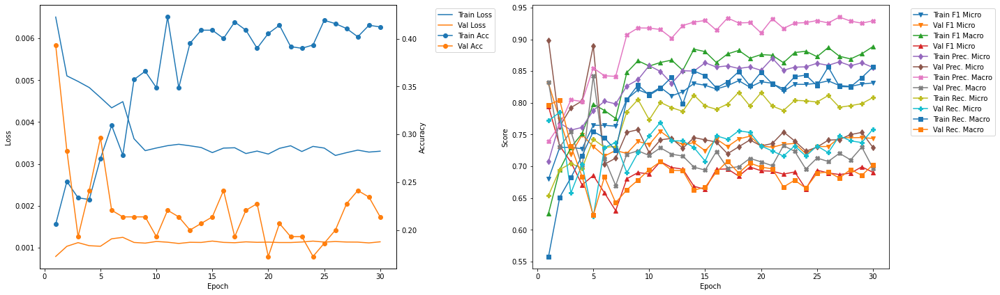

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 1
Train Loss: 0.0065 	Validation Loss: 0.0008
Train Accuracy: 0.2062 	Validation Accuracy: 0.3931
Train F1 Mirco: 0.6799 	Validation F1 Micro: 0.8302
Train F1 Marco: 0.626 	Validation F1 Macro: 0.794
Train Precision Mirco: 0.7078 	Validation Precision Micro: 0.8981
Train Precision Marco: 0.739 	Validation Precision Macro: 0.8321
Train Recall Mirco: 0.6541 	Validation Recall Micro: 0.7719
Train Recall Marco: 0.558 	Validation Recall Macro: 0.7967


In [73]:
Kfold_train_CNN(model = densenet121, training_data = training_data, learning_rate = 0.01, k_folds = 5, n_epochs = 30, model_name = 'densenet121')

-------------------------------------------
FOLD 0
-------------------------------------------
Validation F1 Micro Score Increased (0.000000 --> 0.467742).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 0.16
Train Loss: 0.016 	Validation Loss: 0.0028
Train Accuracy: 0.0499 	Validation Accuracy: 0.0616
Train F1 Mirco: 0.4227 	Validation F1 Micro: 0.4677
Train F1 Marco: 0.1193 	Validation F1 Macro: 0.0659
Train Precision Mirco: 0.4433 	Validation Precision Micro: 0.6591
Train Precision Marco: 0.1347 	Validation Precision Macro: 0.0747
Train Recall Mirco: 0.404 	Validation Recall Micro: 0.3625
Train Recall Marco: 0.12 	Validation Recall Macro: 0.071

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.31
Train Loss: 0.0093 	Validation Loss: 0.0027
Train Accuracy: 0.1102 	Validation Accuracy: 0.1164
Train F1 Mirco: 0.5141 	Validation F1 Micro: 0.4178
Train F1 Marco: 0.1429 	Validation F1 Macro: 0.0608
Train Precision Mirco: 0.6365 	Validation Precision Micro: 0.663
Train Precision Ma

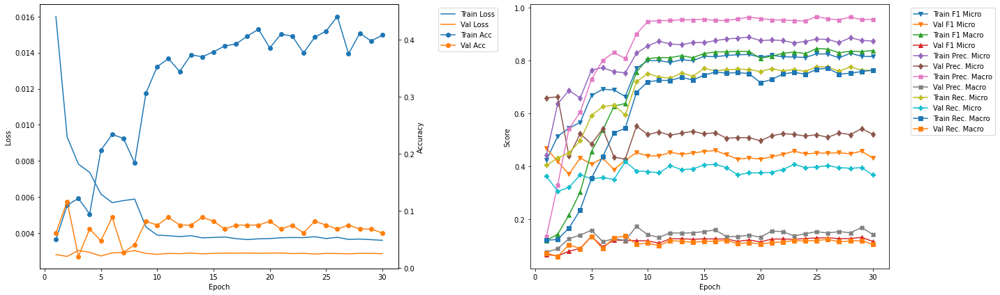

-------------------------------------------
FOLD 1
-------------------------------------------
Validation F1 Micro Score Increased (0.467742 --> 0.709832).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 4.73
Train Loss: 0.0097 	Validation Loss: 0.0014
Train Accuracy: 0.1205 	Validation Accuracy: 0.1849
Train F1 Mirco: 0.5747 	Validation F1 Micro: 0.7098
Train F1 Marco: 0.4174 	Validation F1 Macro: 0.5614
Train Precision Mirco: 0.6146 	Validation Precision Micro: 0.7184
Train Precision Marco: 0.5555 	Validation Precision Macro: 0.699
Train Recall Mirco: 0.5397 	Validation Recall Micro: 0.7014
Train Recall Marco: 0.3564 	Validation Recall Macro: 0.5986

Validation F1 Micro Score Increased (0.709832 --> 0.710991).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.88
Train Loss: 0.0063 	Validation Loss: 0.0014
Train Accuracy: 0.1893 	Validation Accuracy: 0.1918
Train F1 Mirco: 0.6725 	Validation F1 Micro: 0.711
Train F1 Marco: 0.5835 	Validation F1 Macro: 0.5203


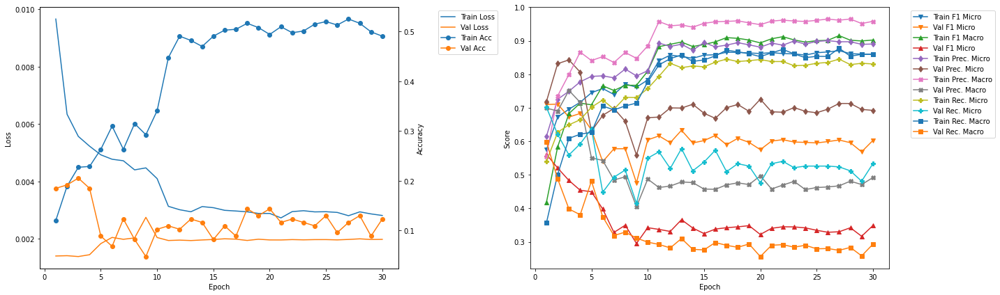

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.710991 --> 0.842510).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 9.29
Train Loss: 0.0079 	Validation Loss: 0.0008
Train Accuracy: 0.1615 	Validation Accuracy: 0.4207
Train F1 Mirco: 0.6439 	Validation F1 Micro: 0.8425
Train F1 Marco: 0.5378 	Validation F1 Macro: 0.8553
Train Precision Mirco: 0.6847 	Validation Precision Micro: 0.7947
Train Precision Marco: 0.6703 	Validation Precision Macro: 0.8529
Train Recall Mirco: 0.6076 	Validation Recall Micro: 0.8965
Train Recall Marco: 0.4641 	Validation Recall Macro: 0.9114

Validation F1 Micro Score Increased (0.842510 --> 0.849934).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.44
Train Loss: 0.0052 	Validation Loss: 0.0008
Train Accuracy: 0.268 	Validation Accuracy: 0.4276
Train F1 Mirco: 0.7423 	Validation F1 Micro: 0.8499
Train F1 Marco: 0.6648 	Validation F1 Macro: 0.8692

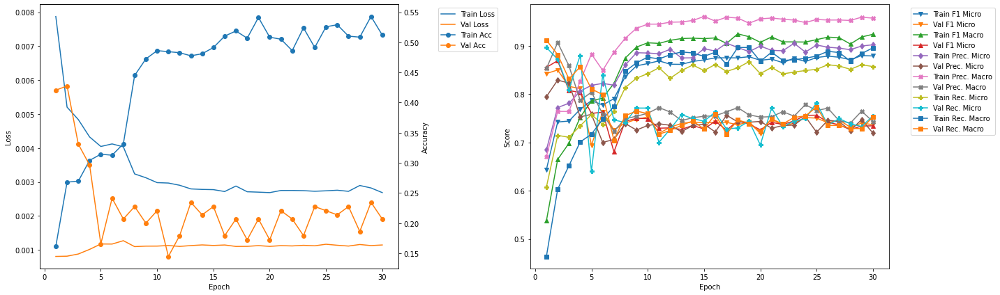

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.849934 --> 0.869123).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 13.85
Train Loss: 0.0065 	Validation Loss: 0.0007
Train Accuracy: 0.1976 	Validation Accuracy: 0.4621
Train F1 Mirco: 0.7009 	Validation F1 Micro: 0.8691
Train F1 Marco: 0.648 	Validation F1 Macro: 0.8353
Train Precision Mirco: 0.729 	Validation Precision Micro: 0.8424
Train Precision Marco: 0.7258 	Validation Precision Macro: 0.8398
Train Recall Mirco: 0.675 	Validation Recall Micro: 0.8976
Train Recall Marco: 0.5914 	Validation Recall Macro: 0.8801

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.01
Train Loss: 0.0046 	Validation Loss: 0.0008
Train Accuracy: 0.2904 	Validation Accuracy: 0.4345
Train F1 Mirco: 0.7624 	Validation F1 Micro: 0.8343
Train F1 Marco: 0.7451 	Validation F1 Macro: 0.7676
Train Precision Mirco: 0.7949 	Validation Precision Micro: 0.8805
Train Precisi

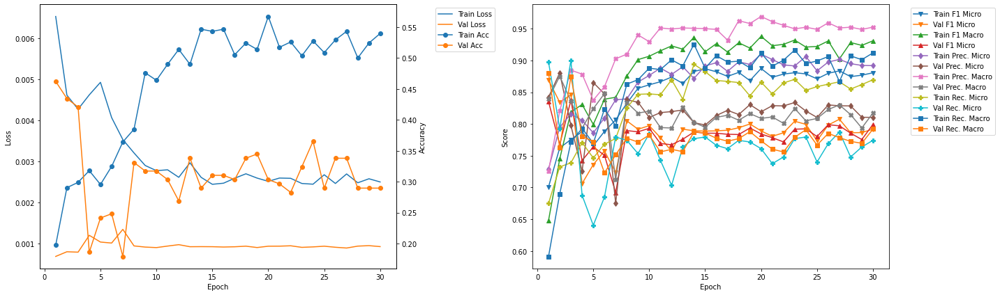

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.869123 --> 0.892715).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 18.43
Train Loss: 0.0062 	Validation Loss: 0.0006
Train Accuracy: 0.2405 	Validation Accuracy: 0.5379
Train F1 Mirco: 0.7261 	Validation F1 Micro: 0.8927
Train F1 Marco: 0.6229 	Validation F1 Macro: 0.8495
Train Precision Mirco: 0.7573 	Validation Precision Micro: 0.8915
Train Precision Marco: 0.6889 	Validation Precision Macro: 0.8418
Train Recall Mirco: 0.6975 	Validation Recall Micro: 0.8939
Train Recall Marco: 0.5721 	Validation Recall Macro: 0.8681

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.58
Train Loss: 0.0039 	Validation Loss: 0.0006
Train Accuracy: 0.3711 	Validation Accuracy: 0.4897
Train F1 Mirco: 0.8058 	Validation F1 Micro: 0.8609
Train F1 Marco: 0.8264 	Validation F1 Macro: 0.8151
Train Precision Mirco: 0.8136 	Validation Precision Micro: 0.8598
Train Prec

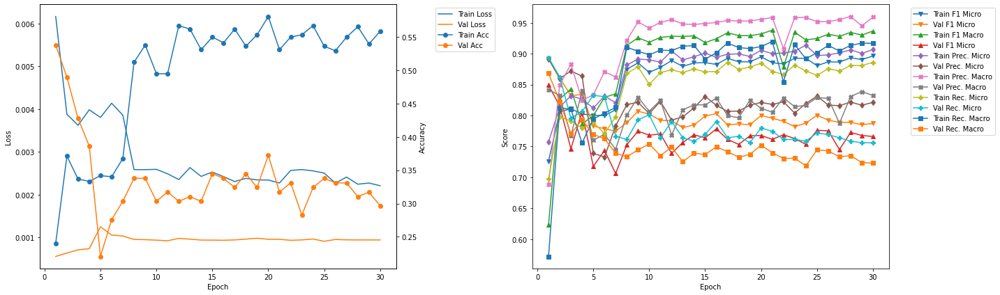

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 1
Train Loss: 0.0062 	Validation Loss: 0.0006
Train Accuracy: 0.2405 	Validation Accuracy: 0.5379
Train F1 Mirco: 0.7261 	Validation F1 Micro: 0.8927
Train F1 Marco: 0.6229 	Validation F1 Macro: 0.8495
Train Precision Mirco: 0.7573 	Validation Precision Micro: 0.8915
Train Precision Marco: 0.6889 	Validation Precision Macro: 0.8418
Train Recall Mirco: 0.6975 	Validation Recall Micro: 0.8939
Train Recall Marco: 0.5721 	Validation Recall Macro: 0.8681


In [74]:
Kfold_train_CNN(model = densenet169, training_data = training_data, learning_rate = 0.01, k_folds = 5, n_epochs = 30, model_name = 'densenet169')

-------------------------------------------
FOLD 0
-------------------------------------------
Validation F1 Micro Score Increased (0.000000 --> 0.200837).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 0.16
Train Loss: 0.0165 	Validation Loss: 0.0035
Train Accuracy: 0.0448 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.3897 	Validation F1 Micro: 0.2008
Train F1 Marco: 0.1162 	Validation F1 Macro: 0.0513
Train Precision Mirco: 0.4166 	Validation Precision Micro: 0.6
Train Precision Marco: 0.1313 	Validation Precision Macro: 0.0981
Train Recall Mirco: 0.366 	Validation Recall Micro: 0.1206
Train Recall Marco: 0.1099 	Validation Recall Macro: 0.0404

Validation F1 Micro Score Increased (0.200837 --> 0.496392).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.33
Train Loss: 0.0097 	Validation Loss: 0.0027
Train Accuracy: 0.0792 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5045 	Validation F1 Micro: 0.4964
Train F1 Marco: 0.1512 	Validation F1 Macro: 0.0997
Tr

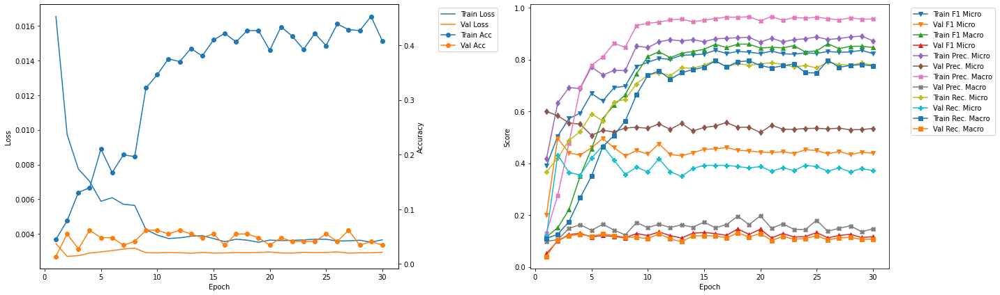

-------------------------------------------
FOLD 1
-------------------------------------------
Validation F1 Micro Score Increased (0.496392 --> 0.748496).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 4.99
Train Loss: 0.0095 	Validation Loss: 0.0013
Train Accuracy: 0.1532 	Validation Accuracy: 0.2192
Train F1 Mirco: 0.5916 	Validation F1 Micro: 0.7485
Train F1 Marco: 0.4022 	Validation F1 Macro: 0.6237
Train Precision Mirco: 0.644 	Validation Precision Micro: 0.7387
Train Precision Marco: 0.527 	Validation Precision Macro: 0.7121
Train Recall Mirco: 0.5472 	Validation Recall Micro: 0.7585
Train Recall Marco: 0.3363 	Validation Recall Macro: 0.6711

Validation F1 Micro Score Increased (0.748496 --> 0.751501).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.16
Train Loss: 0.0064 	Validation Loss: 0.0013
Train Accuracy: 0.2151 	Validation Accuracy: 0.2603
Train F1 Mirco: 0.6732 	Validation F1 Micro: 0.7515
Train F1 Marco: 0.5323 	Validation F1 Macro: 0.6217


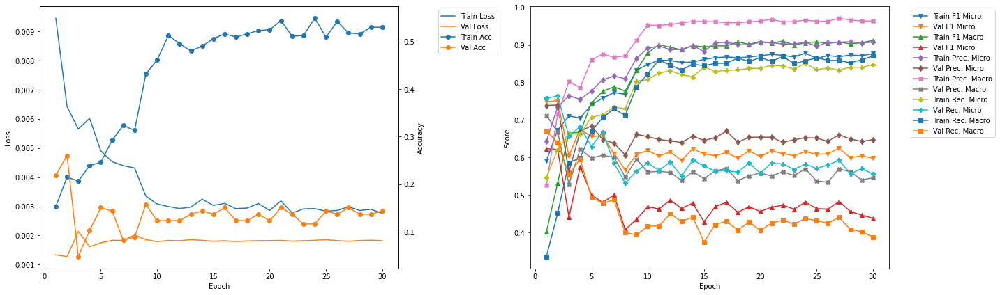

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.751501 --> 0.832918).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 9.81
Train Loss: 0.0073 	Validation Loss: 0.0008
Train Accuracy: 0.1753 	Validation Accuracy: 0.3586
Train F1 Mirco: 0.6532 	Validation F1 Micro: 0.8329
Train F1 Marco: 0.5018 	Validation F1 Macro: 0.7278
Train Precision Mirco: 0.7007 	Validation Precision Micro: 0.7608
Train Precision Marco: 0.6073 	Validation Precision Macro: 0.7308
Train Recall Mirco: 0.6117 	Validation Recall Micro: 0.9201
Train Recall Marco: 0.4392 	Validation Recall Macro: 0.7924

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.97
Train Loss: 0.0048 	Validation Loss: 0.0008
Train Accuracy: 0.2852 	Validation Accuracy: 0.3793
Train F1 Mirco: 0.754 	Validation F1 Micro: 0.8125
Train F1 Marco: 0.736 	Validation F1 Macro: 0.7467
Train Precision Mirco: 0.794 	Validation Precision Micro: 0.8835
Train Precision

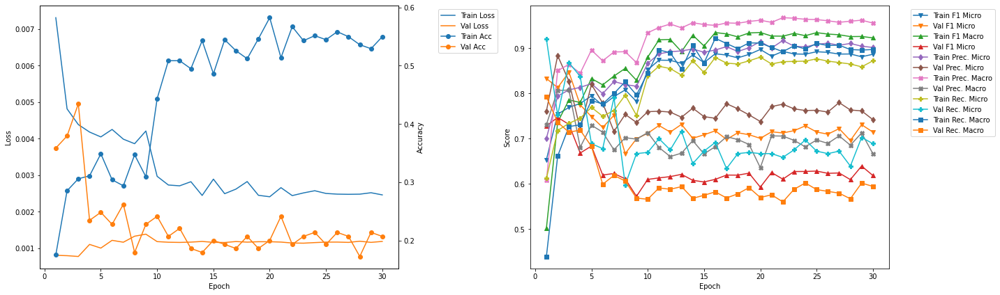

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.846774 --> 0.886624).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 14.63
Train Loss: 0.0061 	Validation Loss: 0.0006
Train Accuracy: 0.2045 	Validation Accuracy: 0.5103
Train F1 Mirco: 0.6998 	Validation F1 Micro: 0.8866
Train F1 Marco: 0.6847 	Validation F1 Macro: 0.8505
Train Precision Mirco: 0.7354 	Validation Precision Micro: 0.8992
Train Precision Marco: 0.8096 	Validation Precision Macro: 0.8597
Train Recall Mirco: 0.6675 	Validation Recall Micro: 0.8744
Train Recall Marco: 0.6077 	Validation Recall Macro: 0.8541

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.79
Train Loss: 0.0041 	Validation Loss: 0.0008
Train Accuracy: 0.3471 	Validation Accuracy: 0.4
Train F1 Mirco: 0.7821 	Validation F1 Micro: 0.8581
Train F1 Marco: 0.7696 	Validation F1 Macro: 0.8149
Train Precision Mirco: 0.8108 	Validation Precision Micro: 0.7987
Train Precisi

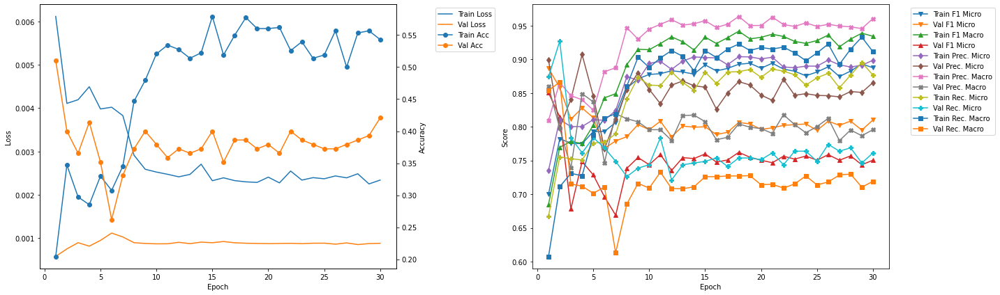

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.44
Train Loss: 0.0056 	Validation Loss: 0.0006
Train Accuracy: 0.2268 	Validation Accuracy: 0.4621
Train F1 Mirco: 0.735 	Validation F1 Micro: 0.8555
Train F1 Marco: 0.6872 	Validation F1 Macro: 0.9441
Train Precision Mirco: 0.7561 	Validation Precision Micro: 0.9207
Train Precision Marco: 0.7782 	Validation Precision Macro: 0.9771
Train Recall Mirco: 0.7151 	Validation Recall Micro: 0.7989
Train Recall Marco: 0.6313 	Validation Recall Macro: 0.9291

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.6
Train Loss: 0.0042 	Validation Loss: 0.0006
Train Accuracy: 0.3041 	Validation Accuracy: 0.5448
Train F1 Mirco: 0.7845 	Validation F1 Micro: 0.8815
Train F1 Marco: 0.7981 	Validation F1 Macro: 0.9504
Train Precision Mirco: 0.8067 	Validation Precision Micro: 0.9195
Train Precision Marco: 0.8435 	Validation Precision Macro: 0.9577
Train Recall Mirco: 0.7635

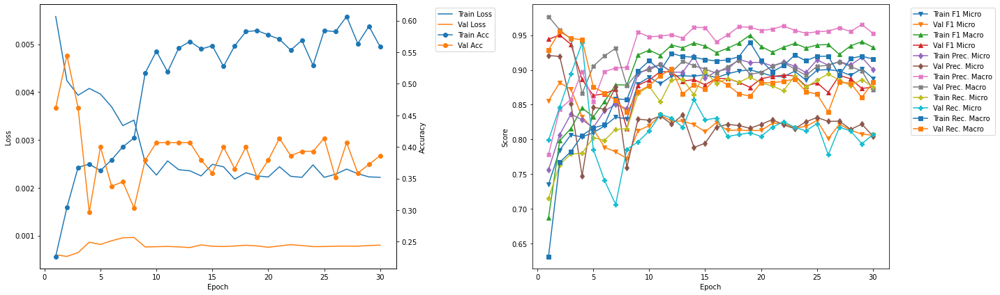

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 3 	Epoch: 1
Train Loss: 0.0061 	Validation Loss: 0.0006
Train Accuracy: 0.2045 	Validation Accuracy: 0.5103
Train F1 Mirco: 0.6998 	Validation F1 Micro: 0.8866
Train F1 Marco: 0.6847 	Validation F1 Macro: 0.8505
Train Precision Mirco: 0.7354 	Validation Precision Micro: 0.8992
Train Precision Marco: 0.8096 	Validation Precision Macro: 0.8597
Train Recall Mirco: 0.6675 	Validation Recall Micro: 0.8744
Train Recall Marco: 0.6077 	Validation Recall Macro: 0.8541


In [75]:
Kfold_train_CNN(model = densenet201, training_data = training_data, learning_rate = 0.01, k_folds = 5, n_epochs = 30, model_name = 'densenet201')

-------------------------------------------
FOLD 0
-------------------------------------------
Validation F1 Micro Score Increased (0.000000 --> 0.472993).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 0.2
Train Loss: 0.0205 	Validation Loss: 0.0042
Train Accuracy: 0.0448 	Validation Accuracy: 0.0753
Train F1 Mirco: 0.3854 	Validation F1 Micro: 0.473
Train F1 Marco: 0.125 	Validation F1 Macro: 0.1252
Train Precision Mirco: 0.397 	Validation Precision Micro: 0.5436
Train Precision Marco: 0.1275 	Validation Precision Macro: 0.1678
Train Recall Mirco: 0.3744 	Validation Recall Micro: 0.4186
Train Recall Marco: 0.1369 	Validation Recall Macro: 0.1322

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.39
Train Loss: 0.0126 	Validation Loss: 0.0038
Train Accuracy: 0.0568 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4966 	Validation F1 Micro: 0.4624
Train F1 Marco: 0.1869 	Validation F1 Macro: 0.1424
Train Precision Mirco: 0.5373 	Validation Precision Micro: 0.473
Train Precision M

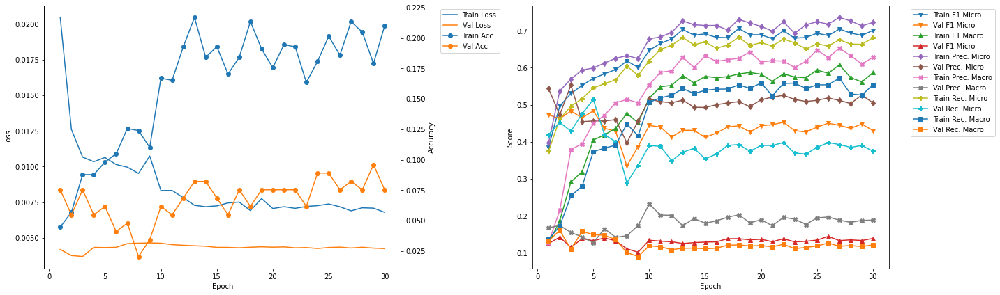

-------------------------------------------
FOLD 1
-------------------------------------------
Validation F1 Micro Score Increased (0.483597 --> 0.691995).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 5.86
Train Loss: 0.0162 	Validation Loss: 0.0021
Train Accuracy: 0.0826 	Validation Accuracy: 0.2055
Train F1 Mirco: 0.5289 	Validation F1 Micro: 0.692
Train F1 Marco: 0.2919 	Validation F1 Macro: 0.5308
Train Precision Mirco: 0.5549 	Validation Precision Micro: 0.7286
Train Precision Marco: 0.3327 	Validation Precision Macro: 0.6335
Train Recall Mirco: 0.5051 	Validation Recall Micro: 0.6589
Train Recall Marco: 0.2689 	Validation Recall Macro: 0.5321

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.04
Train Loss: 0.0128 	Validation Loss: 0.0019
Train Accuracy: 0.0981 	Validation Accuracy: 0.1918
Train F1 Mirco: 0.5647 	Validation F1 Micro: 0.6667
Train F1 Marco: 0.3853 	Validation F1 Macro: 0.5351
Train Precision Mirco: 0.5801 	Validation Precision Micro: 0.7072
Train Precisi

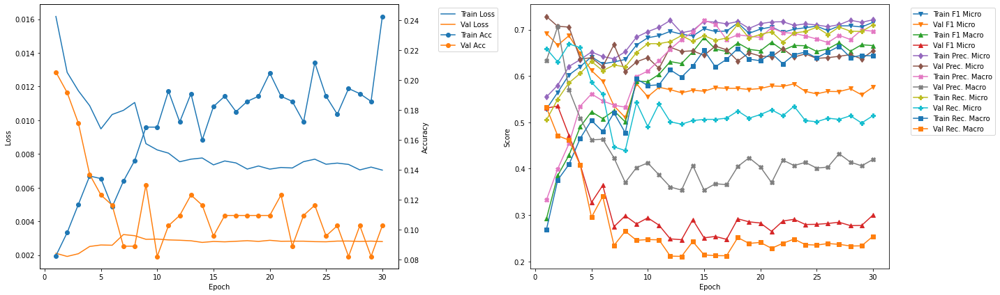

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.691995 --> 0.759388).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 11.39
Train Loss: 0.0149 	Validation Loss: 0.0013
Train Accuracy: 0.0962 	Validation Accuracy: 0.3103
Train F1 Mirco: 0.5785 	Validation F1 Micro: 0.7594
Train F1 Marco: 0.4381 	Validation F1 Macro: 0.6175
Train Precision Mirco: 0.597 	Validation Precision Micro: 0.8149
Train Precision Marco: 0.4765 	Validation Precision Macro: 0.7333
Train Recall Mirco: 0.5611 	Validation Recall Micro: 0.7109
Train Recall Marco: 0.4089 	Validation Recall Macro: 0.5817

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.58
Train Loss: 0.0121 	Validation Loss: 0.0015
Train Accuracy: 0.122 	Validation Accuracy: 0.3034
Train F1 Mirco: 0.6189 	Validation F1 Micro: 0.7119
Train F1 Marco: 0.4994 	Validation F1 Macro: 0.5443
Train Precision Mirco: 0.6243 	Validation Precision Micro: 0.8717
Train Precis

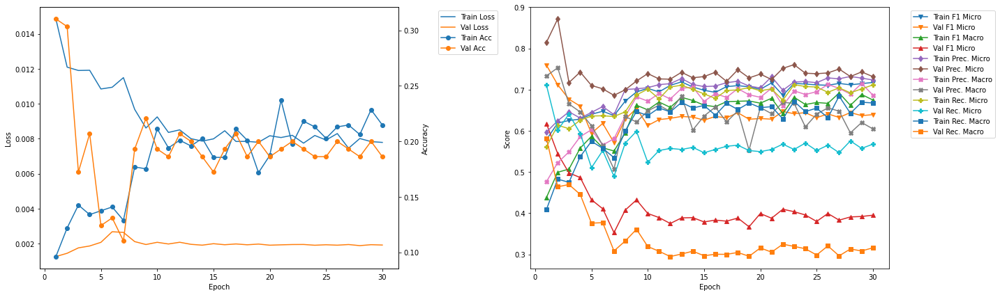

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.759388 --> 0.837736).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 16.94
Train Loss: 0.0143 	Validation Loss: 0.0011
Train Accuracy: 0.0911 	Validation Accuracy: 0.4414
Train F1 Mirco: 0.5902 	Validation F1 Micro: 0.8377
Train F1 Marco: 0.4781 	Validation F1 Macro: 0.7208
Train Precision Mirco: 0.6067 	Validation Precision Micro: 0.8284
Train Precision Marco: 0.5399 	Validation Precision Macro: 0.7844
Train Recall Mirco: 0.5746 	Validation Recall Micro: 0.8473
Train Recall Marco: 0.4435 	Validation Recall Macro: 0.7018

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.12
Train Loss: 0.0114 	Validation Loss: 0.0013
Train Accuracy: 0.1426 	Validation Accuracy: 0.3103
Train F1 Mirco: 0.6365 	Validation F1 Micro: 0.7797
Train F1 Marco: 0.5227 	Validation F1 Macro: 0.6511
Train Precision Mirco: 0.6432 	Validation Precision Micro: 0.8202
Train Prec

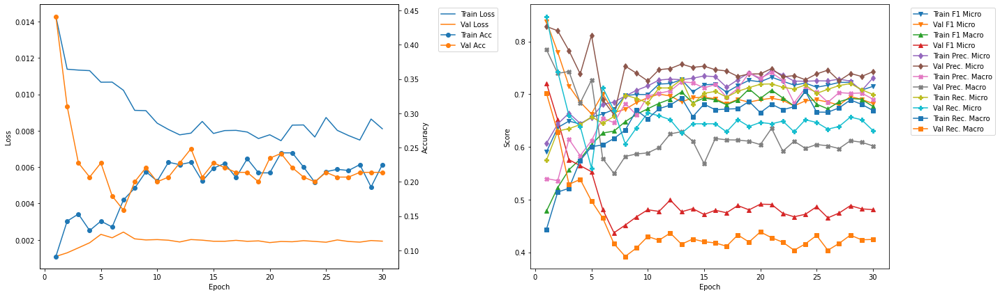

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.837736 --> 0.858311).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 22.48
Train Loss: 0.0129 	Validation Loss: 0.0007
Train Accuracy: 0.146 	Validation Accuracy: 0.4483
Train F1 Mirco: 0.6443 	Validation F1 Micro: 0.8583
Train F1 Marco: 0.5174 	Validation F1 Macro: 0.8343
Train Precision Mirco: 0.6523 	Validation Precision Micro: 0.932
Train Precision Marco: 0.5422 	Validation Precision Macro: 0.9201
Train Recall Mirco: 0.6364 	Validation Recall Micro: 0.7955
Train Recall Marco: 0.4992 	Validation Recall Macro: 0.7948

Epoch 2 	Learning Rate: 0.01 	Time (min): 22.66
Train Loss: 0.0122 	Validation Loss: 0.001
Train Accuracy: 0.1375 	Validation Accuracy: 0.4069
Train F1 Mirco: 0.6558 	Validation F1 Micro: 0.8255
Train F1 Marco: 0.5922 	Validation F1 Macro: 0.781
Train Precision Mirco: 0.6619 	Validation Precision Micro: 0.8522
Train Precisio

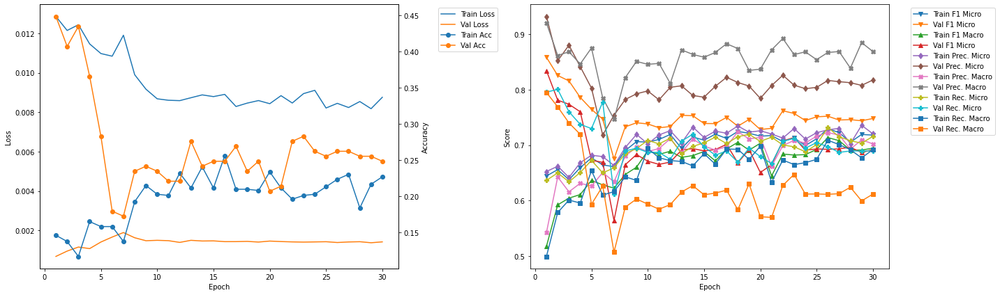

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 1
Train Loss: 0.0129 	Validation Loss: 0.0007
Train Accuracy: 0.146 	Validation Accuracy: 0.4483
Train F1 Mirco: 0.6443 	Validation F1 Micro: 0.8583
Train F1 Marco: 0.5174 	Validation F1 Macro: 0.8343
Train Precision Mirco: 0.6523 	Validation Precision Micro: 0.932
Train Precision Marco: 0.5422 	Validation Precision Macro: 0.9201
Train Recall Mirco: 0.6364 	Validation Recall Micro: 0.7955
Train Recall Marco: 0.4992 	Validation Recall Macro: 0.7948


In [76]:
Kfold_train_CNN(model = vgg11bn, training_data = training_data, learning_rate = 0.01, k_folds = 5, n_epochs = 30, model_name = 'vgg11bn')

-------------------------------------------
FOLD 0
-------------------------------------------
Validation F1 Micro Score Increased (0.000000 --> 0.511873).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 0.22
Train Loss: 0.0251 	Validation Loss: 0.0042
Train Accuracy: 0.0448 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.3826 	Validation F1 Micro: 0.5119
Train F1 Marco: 0.1252 	Validation F1 Macro: 0.1198
Train Precision Mirco: 0.4037 	Validation Precision Micro: 0.5272
Train Precision Marco: 0.1408 	Validation Precision Macro: 0.1267
Train Recall Mirco: 0.3635 	Validation Recall Micro: 0.4974
Train Recall Marco: 0.1162 	Validation Recall Macro: 0.1358

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.41
Train Loss: 0.015 	Validation Loss: 0.0041
Train Accuracy: 0.0757 	Validation Accuracy: 0.0616
Train F1 Mirco: 0.5198 	Validation F1 Micro: 0.3503
Train F1 Marco: 0.2404 	Validation F1 Macro: 0.0876
Train Precision Mirco: 0.5485 	Validation Precision Micro: 0.5202
Train Precisi

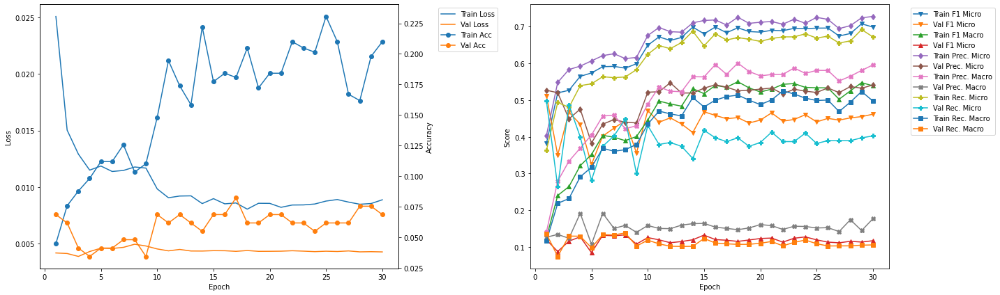

-------------------------------------------
FOLD 1
-------------------------------------------
Validation F1 Micro Score Increased (0.511873 --> 0.675497).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 6.16
Train Loss: 0.0174 	Validation Loss: 0.002
Train Accuracy: 0.0981 	Validation Accuracy: 0.2329
Train F1 Mirco: 0.5517 	Validation F1 Micro: 0.6755
Train F1 Marco: 0.3287 	Validation F1 Macro: 0.4463
Train Precision Mirco: 0.5782 	Validation Precision Micro: 0.7005
Train Precision Marco: 0.3628 	Validation Precision Macro: 0.5566
Train Recall Mirco: 0.5276 	Validation Recall Micro: 0.6522
Train Recall Marco: 0.3033 	Validation Recall Macro: 0.4473

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.36
Train Loss: 0.0142 	Validation Loss: 0.0024
Train Accuracy: 0.1102 	Validation Accuracy: 0.1781
Train F1 Mirco: 0.5865 	Validation F1 Micro: 0.6624
Train F1 Marco: 0.4015 	Validation F1 Macro: 0.3895
Train Precision Mirco: 0.6018 	Validation Precision Micro: 0.6702
Train Precisi

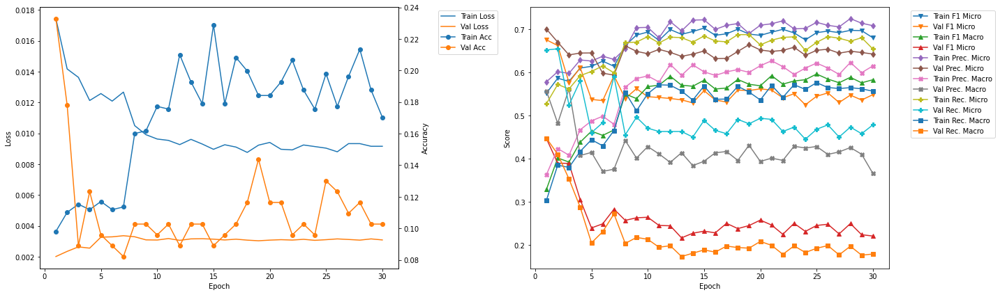

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.675497 --> 0.779487).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 12.11
Train Loss: 0.0164 	Validation Loss: 0.0016
Train Accuracy: 0.0825 	Validation Accuracy: 0.2966
Train F1 Mirco: 0.5671 	Validation F1 Micro: 0.7795
Train F1 Marco: 0.3937 	Validation F1 Macro: 0.5798
Train Precision Mirco: 0.5853 	Validation Precision Micro: 0.7735
Train Precision Marco: 0.4229 	Validation Precision Macro: 0.6765
Train Recall Mirco: 0.55 	Validation Recall Micro: 0.7855
Train Recall Marco: 0.371 	Validation Recall Macro: 0.5688

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.31
Train Loss: 0.0139 	Validation Loss: 0.0022
Train Accuracy: 0.1065 	Validation Accuracy: 0.1793
Train F1 Mirco: 0.6005 	Validation F1 Micro: 0.7246
Train F1 Marco: 0.4385 	Validation F1 Macro: 0.5537
Train Precision Mirco: 0.6159 	Validation Precision Micro: 0.6803
Train Precisi

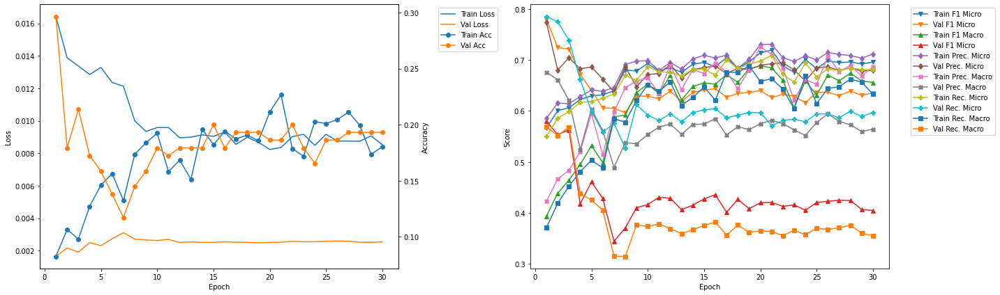

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.779487 --> 0.826347).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 18.05
Train Loss: 0.0149 	Validation Loss: 0.0014
Train Accuracy: 0.1186 	Validation Accuracy: 0.331
Train F1 Mirco: 0.5953 	Validation F1 Micro: 0.8263
Train F1 Marco: 0.4595 	Validation F1 Macro: 0.8426
Train Precision Mirco: 0.6138 	Validation Precision Micro: 0.7566
Train Precision Marco: 0.5036 	Validation Precision Macro: 0.8661
Train Recall Mirco: 0.5778 	Validation Recall Micro: 0.9103
Train Recall Marco: 0.4344 	Validation Recall Macro: 0.852

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.25
Train Loss: 0.0126 	Validation Loss: 0.0015
Train Accuracy: 0.1495 	Validation Accuracy: 0.2759
Train F1 Mirco: 0.6359 	Validation F1 Micro: 0.7805
Train F1 Marco: 0.5502 	Validation F1 Macro: 0.7245
Train Precision Mirco: 0.6432 	Validation Precision Micro: 0.76
Train Precisio

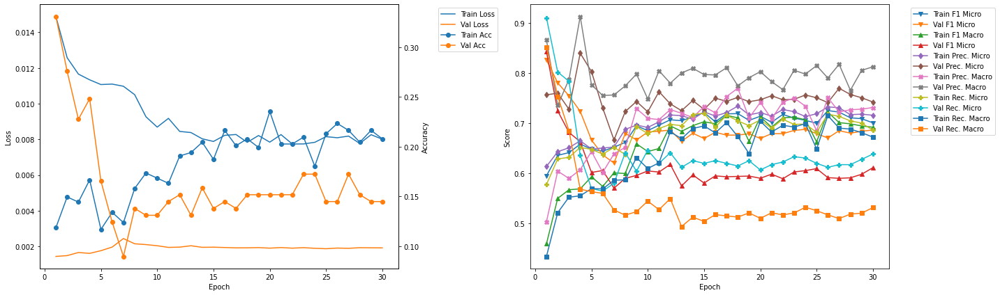

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.826347 --> 0.838868).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 24.0
Train Loss: 0.0138 	Validation Loss: 0.0009
Train Accuracy: 0.134 	Validation Accuracy: 0.4345
Train F1 Mirco: 0.6167 	Validation F1 Micro: 0.8389
Train F1 Marco: 0.5194 	Validation F1 Macro: 0.817
Train Precision Mirco: 0.6308 	Validation Precision Micro: 0.8257
Train Precision Marco: 0.5732 	Validation Precision Macro: 0.8529
Train Recall Mirco: 0.6031 	Validation Recall Micro: 0.8525
Train Recall Marco: 0.4845 	Validation Recall Macro: 0.8138

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.2
Train Loss: 0.0121 	Validation Loss: 0.0012
Train Accuracy: 0.1203 	Validation Accuracy: 0.3103
Train F1 Mirco: 0.6287 	Validation F1 Micro: 0.788
Train F1 Marco: 0.571 	Validation F1 Macro: 0.758
Train Precision Mirco: 0.6324 	Validation Precision Micro: 0.8211
Train Precision M

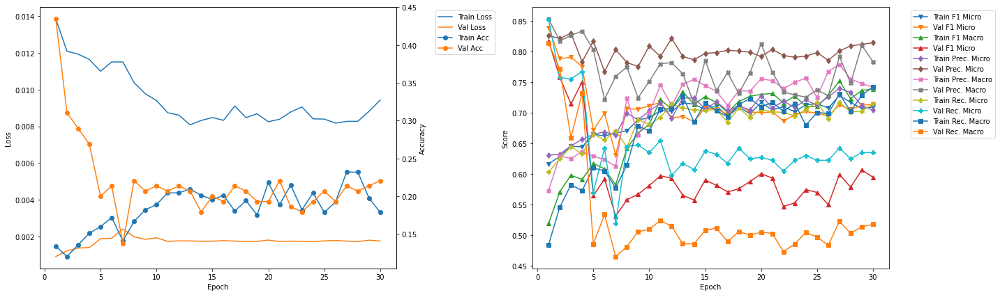

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 1
Train Loss: 0.0138 	Validation Loss: 0.0009
Train Accuracy: 0.134 	Validation Accuracy: 0.4345
Train F1 Mirco: 0.6167 	Validation F1 Micro: 0.8389
Train F1 Marco: 0.5194 	Validation F1 Macro: 0.817
Train Precision Mirco: 0.6308 	Validation Precision Micro: 0.8257
Train Precision Marco: 0.5732 	Validation Precision Macro: 0.8529
Train Recall Mirco: 0.6031 	Validation Recall Micro: 0.8525
Train Recall Marco: 0.4845 	Validation Recall Macro: 0.8138


In [77]:
Kfold_train_CNN(model = vgg16bn, training_data = training_data, learning_rate = 0.01, k_folds = 5, n_epochs = 30, model_name = 'vgg16bn')

-------------------------------------------
FOLD 0
-------------------------------------------
Validation F1 Micro Score Increased (0.000000 --> 0.429032).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 0.22
Train Loss: 0.0261 	Validation Loss: 0.0051
Train Accuracy: 0.0258 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.395 	Validation F1 Micro: 0.429
Train F1 Marco: 0.1445 	Validation F1 Macro: 0.0854
Train Precision Mirco: 0.3974 	Validation Precision Micro: 0.5733
Train Precision Marco: 0.1444 	Validation Precision Macro: 0.1077
Train Recall Mirco: 0.3926 	Validation Recall Micro: 0.3428
Train Recall Marco: 0.15 	Validation Recall Macro: 0.0887

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.43
Train Loss: 0.0159 	Validation Loss: 0.0043
Train Accuracy: 0.0602 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4969 	Validation F1 Micro: 0.3858
Train F1 Marco: 0.2124 	Validation F1 Macro: 0.0946
Train Precision Mirco: 0.5318 	Validation Precision Micro: 0.4808
Train Precision 

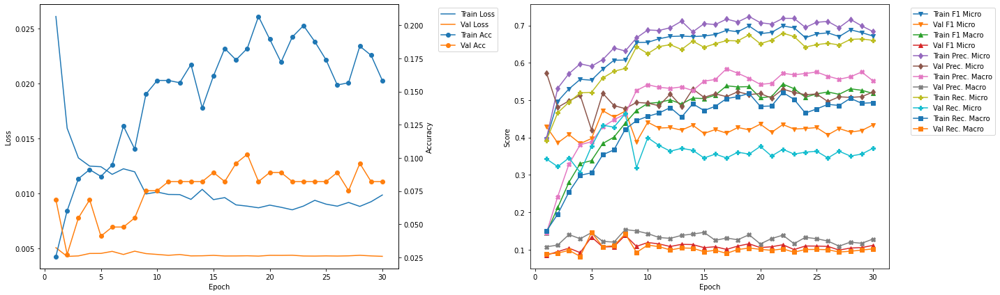

-------------------------------------------
FOLD 1
-------------------------------------------
Validation F1 Micro Score Increased (0.471910 --> 0.600000).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 6.4
Train Loss: 0.0171 	Validation Loss: 0.0027
Train Accuracy: 0.0775 	Validation Accuracy: 0.1438
Train F1 Mirco: 0.5251 	Validation F1 Micro: 0.6
Train F1 Marco: 0.2936 	Validation F1 Macro: 0.3962
Train Precision Mirco: 0.5404 	Validation Precision Micro: 0.7443
Train Precision Marco: 0.3131 	Validation Precision Macro: 0.5315
Train Recall Mirco: 0.5106 	Validation Recall Micro: 0.5026
Train Recall Marco: 0.2791 	Validation Recall Macro: 0.3887

Validation F1 Micro Score Increased (0.600000 --> 0.659119).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.63
Train Loss: 0.0146 	Validation Loss: 0.0026
Train Accuracy: 0.0947 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.579 	Validation F1 Micro: 0.6591
Train F1 Marco: 0.3617 	Validation F1 Macro: 0.386
Trai

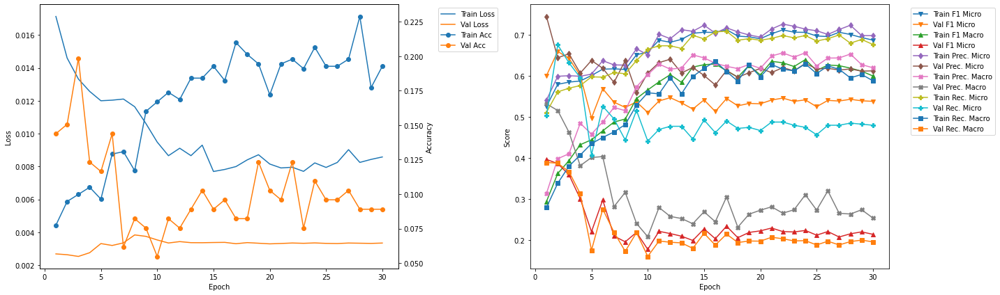

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.659119 --> 0.787421).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 12.59
Train Loss: 0.016 	Validation Loss: 0.0014
Train Accuracy: 0.1065 	Validation Accuracy: 0.3034
Train F1 Mirco: 0.5831 	Validation F1 Micro: 0.7874
Train F1 Marco: 0.4391 	Validation F1 Macro: 0.6459
Train Precision Mirco: 0.5981 	Validation Precision Micro: 0.8109
Train Precision Marco: 0.4818 	Validation Precision Macro: 0.7513
Train Recall Mirco: 0.5689 	Validation Recall Micro: 0.7653
Train Recall Marco: 0.4125 	Validation Recall Macro: 0.6247

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.79
Train Loss: 0.0136 	Validation Loss: 0.0018
Train Accuracy: 0.1151 	Validation Accuracy: 0.2552
Train F1 Mirco: 0.6125 	Validation F1 Micro: 0.762
Train F1 Marco: 0.4775 	Validation F1 Macro: 0.5878
Train Precision Mirco: 0.6198 	Validation Precision Micro: 0.79
Train Precisio

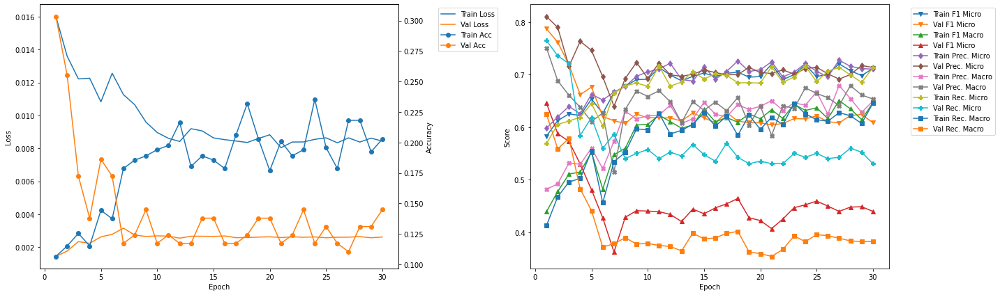

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.787421 --> 0.832664).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 18.74
Train Loss: 0.0168 	Validation Loss: 0.001
Train Accuracy: 0.1082 	Validation Accuracy: 0.4345
Train F1 Mirco: 0.5897 	Validation F1 Micro: 0.8327
Train F1 Marco: 0.4632 	Validation F1 Macro: 0.7611
Train Precision Mirco: 0.5963 	Validation Precision Micro: 0.8761
Train Precision Marco: 0.4821 	Validation Precision Macro: 0.8158
Train Recall Mirco: 0.5833 	Validation Recall Micro: 0.7934
Train Recall Marco: 0.4496 	Validation Recall Macro: 0.7546

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.95
Train Loss: 0.0138 	Validation Loss: 0.0013
Train Accuracy: 0.1082 	Validation Accuracy: 0.331
Train F1 Mirco: 0.6196 	Validation F1 Micro: 0.8039
Train F1 Marco: 0.4622 	Validation F1 Macro: 0.7258
Train Precision Mirco: 0.6239 	Validation Precision Micro: 0.778
Train Precisi

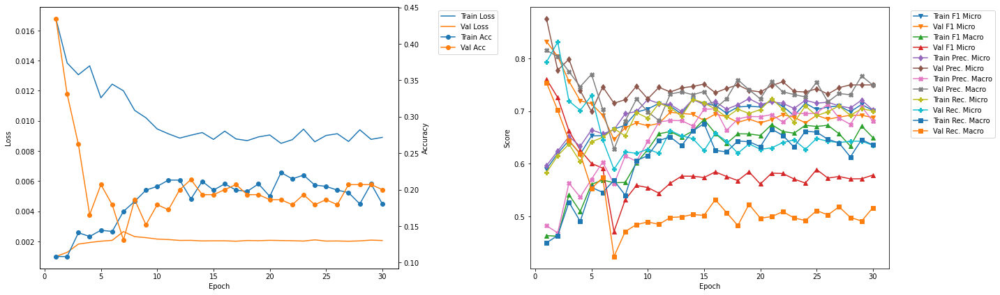

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.88
Train Loss: 0.017 	Validation Loss: 0.0009
Train Accuracy: 0.1031 	Validation Accuracy: 0.331
Train F1 Mirco: 0.6022 	Validation F1 Micro: 0.7946
Train F1 Marco: 0.4864 	Validation F1 Macro: 0.7456
Train Precision Mirco: 0.6104 	Validation Precision Micro: 0.7893
Train Precision Marco: 0.521 	Validation Precision Macro: 0.8289
Train Recall Mirco: 0.5942 	Validation Recall Micro: 0.8
Train Recall Marco: 0.4609 	Validation Recall Macro: 0.7437

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.08
Train Loss: 0.0133 	Validation Loss: 0.0011
Train Accuracy: 0.1289 	Validation Accuracy: 0.3586
Train F1 Mirco: 0.6466 	Validation F1 Micro: 0.7818
Train F1 Marco: 0.567 	Validation F1 Macro: 0.7348
Train Precision Mirco: 0.6523 	Validation Precision Micro: 0.853
Train Precision Marco: 0.6016 	Validation Precision Macro: 0.8253
Train Recall Mirco: 0.6411 	Vali

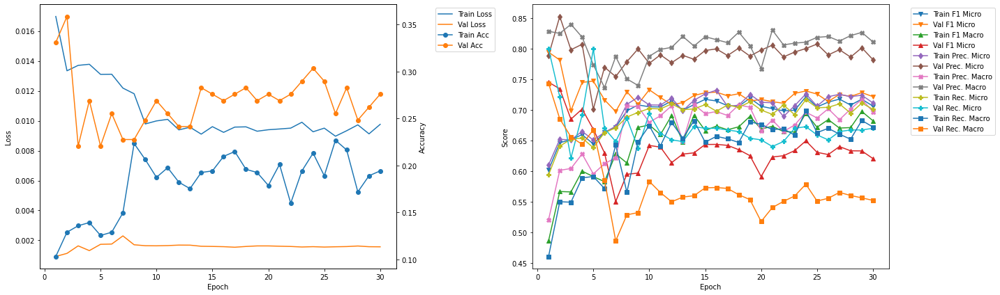

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 3 	Epoch: 1
Train Loss: 0.0168 	Validation Loss: 0.001
Train Accuracy: 0.1082 	Validation Accuracy: 0.4345
Train F1 Mirco: 0.5897 	Validation F1 Micro: 0.8327
Train F1 Marco: 0.4632 	Validation F1 Macro: 0.7611
Train Precision Mirco: 0.5963 	Validation Precision Micro: 0.8761
Train Precision Marco: 0.4821 	Validation Precision Macro: 0.8158
Train Recall Mirco: 0.5833 	Validation Recall Micro: 0.7934
Train Recall Marco: 0.4496 	Validation Recall Macro: 0.7546


In [78]:
Kfold_train_CNN(model = vgg19bn, training_data = training_data, learning_rate = 0.01, k_folds = 5, n_epochs = 30, model_name = 'vgg19bn')

In [79]:
print('Total Training Time (HR:M:S): ' + str(datetime.timedelta(hours = ((time.time() - START) / 60 / 60))).rsplit('.', 1)[0])

Total Training Time (HR:M:S): 3:39:35


# 
# 
# 

## Training Summary

### Summary Table

In [80]:
summaryDF = pd.DataFrame({
    'ResNet18' : [5, 3, 0.0054, 0.2062, 0.7007, 0.6946, 0.7355, 0.7875, 0.669, 0.631, 0.0011, 0.2759, 0.7751, 0.768, 0.7644, 0.802, 0.7861, 0.788],
    'ResNet50' : [5, 2, 0.0085, 0.232, 0.7087, 0.5108, 0.7502, 0.5752, 0.6716, 0.4666, 0.0011, 0.4207, 0.8427, 0.6538, 0.8372, 0.6858, 0.8482, 0.6589],
    'ResNet101' : [5, 2, 0.0114, 0.1753, 0.6907, 0.5172, 0.7375, 0.5741, 0.6496, 0.4759, 0.0019, 0.2, 0.7801, 0.5894, 0.7494, 0.6742, 0.8135, 0.6112],
    'DenseNet121' : [5, 1, 0.0065, 0.2062, 0.6799, 0.626, 0.7078, 0.739, 0.6541, 0.558, 0.0008, 0.3931, 0.8302, 0.794, 0.8981, 0.8321, 0.7719, 0.7967],
    'DenseNet169' : [5, 1, 0.0062, 0.2405, 0.7261, 0.6229, 0.7573, 0.6889, 0.6975, 0.5721, 0.0006, 0.5379, 0.8927, 0.8495, 0.8915, 0.8418, 0.8939, 0.8681],
    'DenseNet201' : [4, 1, 0.0061, 0.2045, 0.6998, 0.6847, 0.7354, 0.8096, 0.6675, 0.6077, 0.0006, 0.5103, 0.8866, 0.8505, 0.8992, 0.8597, 0.8744, 0.8541],
    'VGG11_BN' : [5, 1, 0.0129, 0.146, 0.6443, 0.5174, 0.6523, 0.5422, 0.6364, 0.4992, 0.0007, 0.4483, 0.8583, 0.8343, 0.932, 0.9201, 0.7955, 0.7948],
    'VGG16_BN' : [5, 1, 0.0138, 0.134, 0.6167, 0.5194, 0.6308, 0.5732, 0.6031, 0.4845, 0.0009, 0.4345, 0.8389, 0.817, 0.8257, 0.8529, 0.8525, 0.8138],
    'VGG19_BN' : [4, 1, 0.0168, 0.1082, 0.5897, 0.4632, 0.5963, 0.4821, 0.5833, 0.4496, 0.001, 0.4345, 0.8327, 0.7611, 0.8761, 0.8158, 0.7934, 0.7546]
})
summaryDF.index = ['Fold', 'Epoch', 'Train Loss', 'Train Accuracy', 'Train F1 Micro', 'Train F1 Macro', 'Train Precision Micro', 'Train Precision Macro', 'Train Recall Micro', 'Train Recall Macro',
                   'Val Loss', 'Val Accuracy', 'Val F1 Micro', 'Val F1 Macro', 'Val Precision Micro', 'Val Precision Macro', 'Val Recall Micro', 'Val Recall Macro']

summaryDF

,ResNet18,ResNet50,ResNet101,DenseNet121,DenseNet169,DenseNet201,VGG11_BN,VGG16_BN,VGG19_BN
Fold,5.0000,5.0000,5.0000,5.0000,5.0000,4.0000,5.0000,5.0000,4.0000
Epoch,3.0000,2.0000,2.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
Train Loss,0.0054,0.0085,0.0114,0.0065,0.0062,0.0061,0.0129,0.0138,0.0168
Train Accuracy,0.2062,0.2320,0.1753,0.2062,0.2405,0.2045,0.1460,0.1340,0.1082
Train F1 Micro,0.7007,0.7087,0.6907,0.6799,0.7261,0.6998,0.6443,0.6167,0.5897
Train F1 Macro,0.6946,0.5108,0.5172,0.6260,0.6229,0.6847,0.5174,0.5194,0.4632
Train Precision Micro,0.7355,0.7502,0.7375,0.7078,0.7573,0.7354,0.6523,0.6308,0.5963
Train Precision Macro,0.7875,0.5752,0.5741,0.7390,0.6889,0.8096,0.5422,0.5732,0.4821
Train Recall Micro,0.6690,0.6716,0.6496,0.6541,0.6975,0.6675,0.6364,0.6031,0.5833
Train Recall Macro,0.6310,0.4666,0.4759,0.5580,0.5721,0.6077,0.4992,0.4845,0.4496


### Training Summary Graph

In [81]:
import plotly
import plotly.graph_objects as go

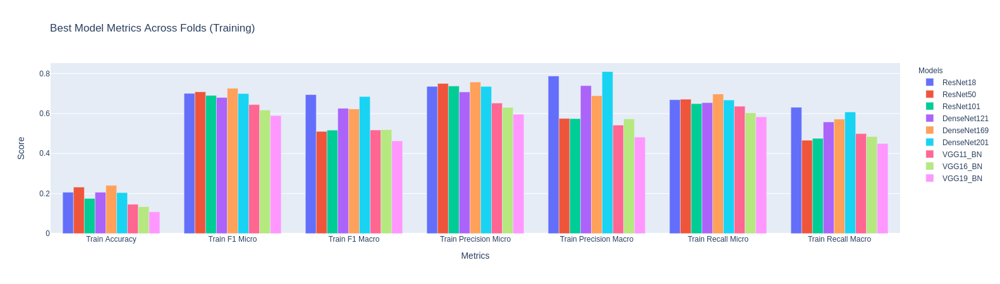

In [82]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[3:10], y = summaryDF['ResNet18'][3:10]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[3:10], y = summaryDF['ResNet50'][3:10]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[3:10], y = summaryDF['ResNet101'][3:10]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[3:10], y = summaryDF['DenseNet121'][3:10]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[3:10], y = summaryDF['DenseNet169'][3:10]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[3:10], y = summaryDF['DenseNet201'][3:10]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[3:10], y = summaryDF['VGG11_BN'][3:10]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[3:10], y = summaryDF['VGG16_BN'][3:10]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[3:10], y = summaryDF['VGG19_BN'][3:10]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Training)',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()

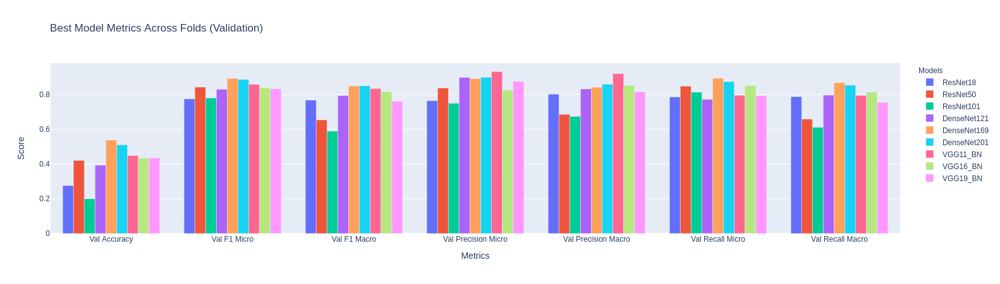

In [83]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[11:], y = summaryDF['ResNet18'][11:]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[11:], y = summaryDF['ResNet50'][11:]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[11:], y = summaryDF['ResNet101'][11:]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[11:], y = summaryDF['DenseNet121'][11:]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[11:], y = summaryDF['DenseNet169'][11:]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[11:], y = summaryDF['DenseNet201'][11:]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[11:], y = summaryDF['VGG11_BN'][11:]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[11:], y = summaryDF['VGG16_BN'][11:]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[11:], y = summaryDF['VGG19_BN'][11:]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Validation)',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()